In [4]:
!pip install ipywidgets

Looking in indexes: https://artifactory.michelin.com/api/pypi/pypi/simple


In [23]:
import ipywidgets
import math
import pandas as pd
import numpy as np

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.model_selection import train_test_split
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score

import matplotlib.pyplot as plt
import seaborn as sns

---

# ⭐ TUNING de CATBOOST Regressor

---
---

In [24]:
df = pd.read_csv("DF_Last_Tuning.csv")
df = df.drop(columns=["Unnamed: 0"])

In [25]:
recup_ENERGYSTARScore = pd.read_csv("DF_Last_Tuning.csv")
recup_ENERGYSTARScore = recup_ENERGYSTARScore["ENERGYSTARScore"]

#### Jeu de donnée polyvalent, suppression de ENERGYSTARScore et de SiteEnergyUse :

In [26]:
df.shape

(3140, 149)

In [27]:
df.columns[:60]

Index(['DataYear', 'BuildingType', 'PrimaryPropertyType',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUseWN(kBtu)', 'DefaultData',
       'ComplianceStatus', 'Outlier', 'TotalGHGEmissions',
       'Multifamily Housing', 'Supermarket/Grocery Store',
       'Other - Restaurant/Bar', 'Single Family Home',
       'Outpatient Rehabilitation/Physical Therapy', 'Self-Storage Facility',
       'Convenience Store without Gas Station', 'Bank Branch',
       'Other - Public Services', 'Other - Technology/Science',
       'Adult Education', 'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       '

In [28]:
df = df.drop(columns=["ENERGYSTARScore", "TotalGHGEmissions"])

In [29]:
# Contrôle rapide dtypes :
df[["CouncilDistrictCode","outlier"]] = df[["CouncilDistrictCode","outlier"]].astype(object)

#Récupération des cat_features :
cat_features = df.select_dtypes(include=["object"]).columns.tolist()

---

### 📍 Encodage :

---

In [30]:
from category_encoders import CatBoostEncoder

In [8]:
X = df.drop(columns=["SiteEnergyUseWN(kBtu)"])
y = df['SiteEnergyUseWN(kBtu)']

encoder = CatBoostEncoder()
df[cat_features] = encoder.fit_transform(df[cat_features],y)

C:\BUSAPPS\Anaconda\lib\site-packages\category_encoders\cat_boost.py:173: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  category = pd.Categorical(series)
C:\BUSAPPS\Anaconda\lib\site-packages\category_encoders\cat_boost.py:173: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  category = pd.Categorical(series)


---

### 📍 Scaling :

---

In [32]:
from sklearn.preprocessing import MinMaxScaler

In [33]:
#X = df.drop(columns=["SiteEnergyUseWN(kBtu)"])
feature_names = X.columns.tolist()

scaler = MinMaxScaler()
X = scaler.fit_transform(X)

#y = df["SiteEnergyUseWN(kBtu)"]

#### Réduction d'échelle pour faciliter le travail de l'algorithme, repassage de y à l'échelle ensuite

In [22]:
y = y/1000000

---

### 📍 Split :

---

In [83]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=42)

---

## 📍 Préparation de train Pool et test Pool pour CatBoost :

---

In [69]:
# importing Pool
from catboost import Pool

#feature_names = X.columns.to_list()
#feature_names = ['F{}'.format(i) for i in range(X.shape[1])]

#Creating pool object for train dataset. we give information of categorical fetures to parameter cat_features
train_pool = Pool(data=train_X,
                  label=train_y,
                  #cat_features=cat_features,
                  feature_names=feature_names,
                 )
#Creating pool object for test dataset
test_pool = Pool(data=test_X,
                  label=test_y,
                  #cat_features=cat_features,
                  feature_names=feature_names,
                 )

---

## 📍 Sélection Best_Features par EFeaturesSelectionAlgorithm RecursiveByShapValues

---

In [52]:
df.shape

(3140, 24)

In [47]:
from catboost import CatBoostRegressor, Pool, EShapCalcType, EFeaturesSelectionAlgorithm
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

model = CatBoostRegressor(iterations=450, random_seed=42)
summary = model.select_features(
    train_pool,
    eval_set=test_pool,
    features_for_select= '0-145',
    #features_for_select='0-99',
    num_features_to_select=49,
    steps=132,
    algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues,
    shap_calc_type=EShapCalcType.Regular,
    #train_final_model=True,
    logging_level='Silent',
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

The number of features selection steps (132) is greater than the number of features to eliminate (97). The number of steps was reduced to 97.


---

### 📍 Feature Importance :

---

In [48]:
model.get_feature_importance(prettified=True).head(60)

,Feature Id,Importances
0,LargestPropertyUseType_Electricity(kBtu),38.357992
1,PropertyGFABuilding(s),15.587925
2,PropertyGFATotal,9.556920
3,NumberofFloors,8.477740
4,outlier,7.401321
5,LargestPropertyUseTypeGFA,4.843068
6,LargestPropertyUseType_SiteEnergyUseWN(kBtu)^1...,2.308919
7,pct_SecondLargestPropertyUseTypeGFA,1.496855
8,PropertyGFAParking,1.287141
9,SecondLargestPropertyUseTypeGFA,1.242026


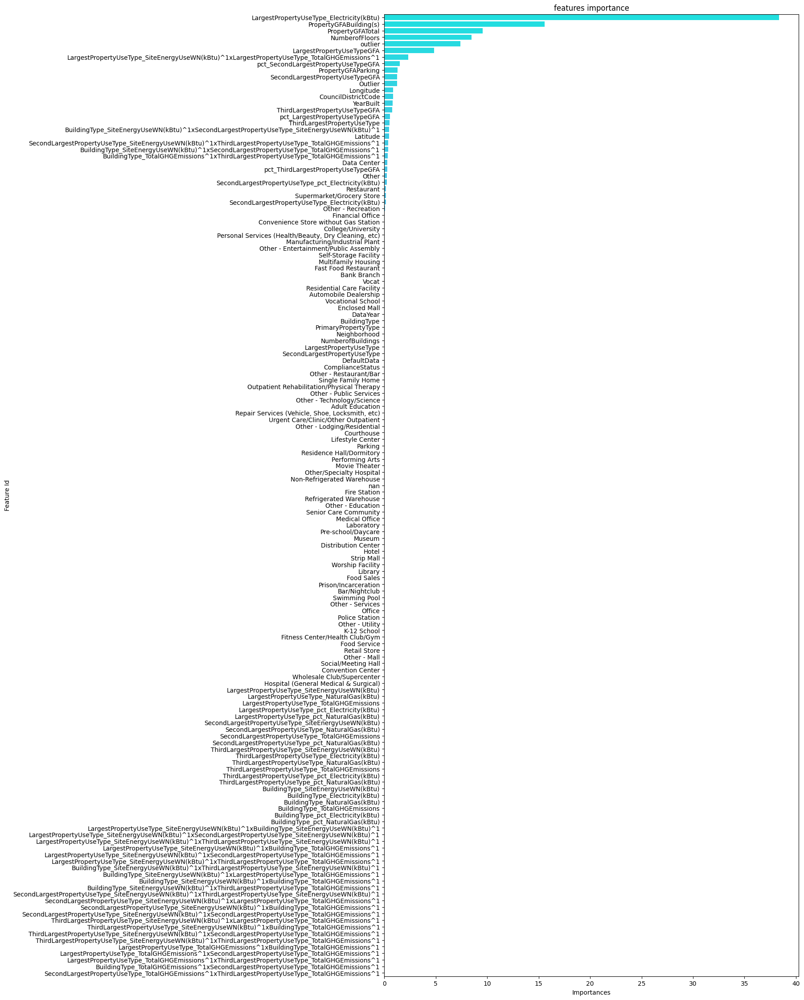

In [49]:
# Create a dataframe of feature importance 
df_feature_importance = pd.DataFrame(model.get_feature_importance(prettified=True))
#plotting feature importance
plt.figure(figsize=(12, 28));
feature_plot= sns.barplot(x="Importances", y="Feature Id", data=df_feature_importance,palette="cool");
plt.title('features importance');

---

---

### 📌 Nom des features sélectionnées :

---

In [51]:
print('Selected features indices:', summary['selected_features'])
print('Selected features names:', summary['selected_features_names'])

Selected features indices: [3, 5, 6, 7, 9, 10, 11, 12, 14, 16, 17, 18, 21, 22, 23, 27, 28, 29, 34, 36, 40, 44, 45, 47, 48, 56, 62, 63, 67, 70, 72, 73, 78, 79, 80, 82, 83, 90, 91, 92, 93, 95, 101, 104, 121, 125, 129, 135, 144]
Selected features names: ['CouncilDistrictCode', 'Latitude', 'Longitude', 'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA', 'Outlier', 'Multifamily Housing', 'Supermarket/Grocery Store', 'Self-Storage Facility', 'Convenience Store without Gas Station', 'Bank Branch', 'Fast Food Restaurant', 'Other - Lodging/Residential', 'Other', 'Enclosed Mall', 'Restaurant', 'Non-Refrigerated Warehouse', 'nan', 'Vocational School', 'Vocat', 'Data Center', 'Financial Office', 'College/University', 'Residential Care Facility', 'Other - Recreation', 'Other - Entertainment/Public Assembly', 'Automobile Deale

---

### 📌 Nom des features supprimées :

---

In [52]:
print('Eliminated features indices:', summary['eliminated_features'])
print('Eliminated features names:', summary['eliminated_features_names'])

Eliminated features indices: [20, 71, 97, 140, 1, 13, 15, 124, 89, 74, 127, 122, 35, 132, 117, 120, 94, 102, 96, 105, 115, 138, 142, 8, 134, 128, 145, 103, 139, 99, 39, 98, 113, 118, 69, 57, 123, 111, 112, 110, 133, 106, 107, 0, 33, 116, 52, 24, 19, 136, 100, 58, 85, 53, 114, 130, 137, 31, 141, 143, 84, 126, 38, 119, 59, 68, 51, 131, 108, 55, 54, 25, 26, 46, 86, 41, 88, 60, 61, 30, 109, 75, 37, 2, 49, 42, 76, 87, 77, 4, 50, 66, 32, 64, 65, 81, 43]
Eliminated features names: ['ComplianceStatus', 'Other - Services', 'LargestPropertyUseType_TotalGHGEmissions', 'LargestPropertyUseType_TotalGHGEmissions^1xBuildingType_TotalGHGEmissions^1', 'BuildingType', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 'LargestPropertyUseType_SiteEnergyUseWN(kBtu)^1xThirdLargestPropertyUseType_TotalGHGEmissions^1', 'Hospital (General Medical & Surgical)', 'Office', 'BuildingType_SiteEnergyUseWN(kBtu)^1xLargestPropertyUseType_TotalGHGEmissions^1', 'LargestPropertyUseType_SiteEnergyUseWN(kBtu)^1xBui

---

In [70]:
feature_names = summary['selected_features_names']
X = df[feature_names]

In [71]:

train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=42)

In [72]:
# importing Pool
from catboost import Pool

#feature_names = X[summary['selected_features_names']].columns
#feature_names = ['F{}'.format(i) for i in range(X.shape[1])]

#Creating pool object for train dataset. we give information of categorical fetures to parameter cat_features
train_pool = Pool(data=train_X,
                  label=train_y,
                  #cat_features=cat_features,
                  feature_names=feature_names,
                 )
#Creating pool object for test dataset
test_pool = Pool(data=test_X,
                  label=test_y,
                  #cat_features=cat_features,
                  feature_names=feature_names,
                 )

In [74]:
from catboost import CatBoostRegressor, Pool, EShapCalcType, EFeaturesSelectionAlgorithm
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

model = CatBoostRegressor(iterations=4500, random_seed=42)
summary = model.select_features(
    train_pool,
    eval_set=test_pool,
    features_for_select= '0-48',
    #features_for_select='0-99',
    num_features_to_select=24,
    steps=39,
    algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues,
    shap_calc_type=EShapCalcType.Regular,
    #train_final_model=True,
    logging_level='Silent',
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

The number of features selection steps (39) is greater than the number of features to eliminate (25). The number of steps was reduced to 25.


In [77]:
model.get_feature_importance(prettified=True).head(24)

,Feature Id,Importances
0,LargestPropertyUseType_Electricity(kBtu),40.992539
1,PropertyGFABuilding(s),15.427300
2,PropertyGFATotal,8.900247
3,NumberofFloors,6.721812
4,outlier,6.345521
5,LargestPropertyUseTypeGFA,5.246241
6,LargestPropertyUseType_SiteEnergyUseWN(kBtu)^1...,1.731129
7,SecondLargestPropertyUseTypeGFA,1.488589
8,pct_SecondLargestPropertyUseTypeGFA,1.431357
9,YearBuilt,1.322777


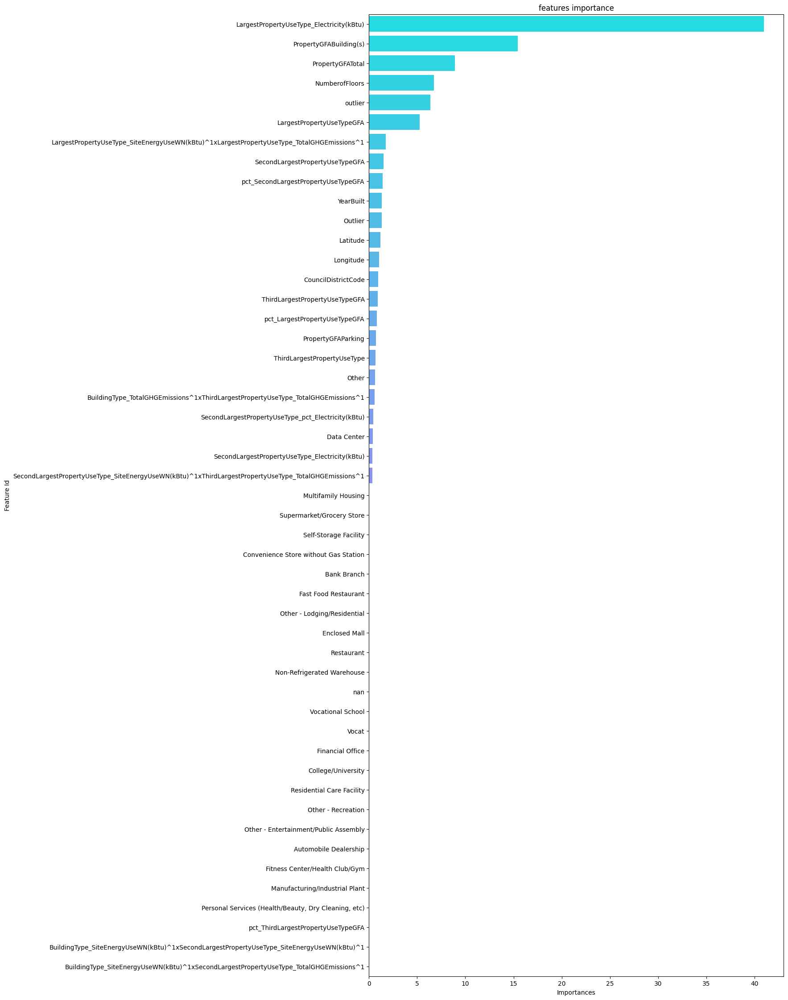

In [78]:
# Create a dataframe of feature importance 
df_feature_importance = pd.DataFrame(model.get_feature_importance(prettified=True))
#plotting feature importance
plt.figure(figsize=(12, 28));
feature_plot= sns.barplot(x="Importances", y="Feature Id", data=df_feature_importance,palette="cool");
plt.title('features importance');

In [79]:
print('Selected features indices:', summary['selected_features'])
print('Selected features names:', summary['selected_features_names'])

Selected features indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 20, 27, 37, 38, 39, 41, 42, 43, 44, 47, 48]
Selected features names: ['CouncilDistrictCode', 'Latitude', 'Longitude', 'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA', 'Outlier', 'Other', 'Data Center', 'outlier', 'pct_LargestPropertyUseTypeGFA', 'pct_SecondLargestPropertyUseTypeGFA', 'LargestPropertyUseType_Electricity(kBtu)', 'SecondLargestPropertyUseType_Electricity(kBtu)', 'SecondLargestPropertyUseType_pct_Electricity(kBtu)', 'LargestPropertyUseType_SiteEnergyUseWN(kBtu)^1xLargestPropertyUseType_TotalGHGEmissions^1', 'SecondLargestPropertyUseType_SiteEnergyUseWN(kBtu)^1xThirdLargestPropertyUseType_TotalGHGEmissions^1', 'BuildingType_TotalGHGEmissions^1xThirdLargestPropertyUseType_TotalGHGEmissions^1']


In [80]:
print('Eliminated features indices:', summary['eliminated_features'])
print('Eliminated features names:', summary['eliminated_features_names'])

Eliminated features indices: [30, 24, 18, 21, 25, 26, 33, 19, 34, 35, 17, 16, 15, 32, 29, 31, 13, 23, 36, 22, 46, 45, 28, 40, 14]
Eliminated features names: ['Residential Care Facility', 'nan', 'Fast Food Restaurant', 'Enclosed Mall', 'Vocational School', 'Vocat', 'Automobile Dealership', 'Other - Lodging/Residential', 'Fitness Center/Health Club/Gym', 'Manufacturing/Industrial Plant', 'Bank Branch', 'Convenience Store without Gas Station', 'Self-Storage Facility', 'Other - Entertainment/Public Assembly', 'College/University', 'Other - Recreation', 'Multifamily Housing', 'Non-Refrigerated Warehouse', 'Personal Services (Health/Beauty, Dry Cleaning, etc)', 'Restaurant', 'BuildingType_SiteEnergyUseWN(kBtu)^1xSecondLargestPropertyUseType_TotalGHGEmissions^1', 'BuildingType_SiteEnergyUseWN(kBtu)^1xSecondLargestPropertyUseType_SiteEnergyUseWN(kBtu)^1', 'Financial Office', 'pct_ThirdLargestPropertyUseTypeGFA', 'Supermarket/Grocery Store']


---
---

In [81]:
import optuna

---

# Tuning Hyperparamétrique !

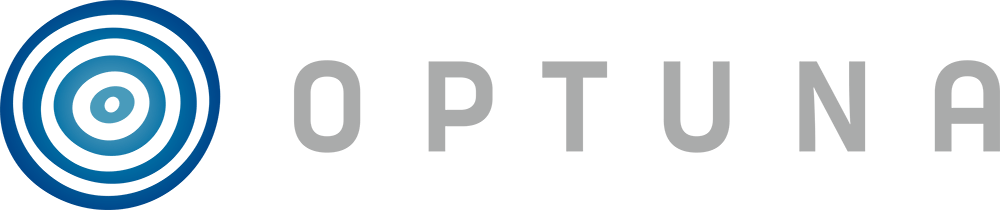

## ⚡ Utilisation Mémoire Expérimentale, modèle ré-entrainable à l'infini

---

#### 📌 Import des librairies

In [84]:
import sys
import optuna
from optuna.samplers import TPESampler
from sklearn.metrics import mean_squared_error, r2_score

In [379]:
pip install --upgrade optuna

Note: you may need to restart the kernel to use updated packages.


In [ ]:
X = df[feature_names]

In [86]:
data = df[summary['selected_features_names']]
y = df['SiteEnergyUseWN(kBtu)']
y = y/1000000

---

## Étude 1 : CatBoost sans noeuds profonds

---

#### 📌 Déclaration de l'étude et du lieu de stockage

In [153]:
import logging

# Add stream handler of stdout to show the messages
#optuna.logging.get_logger("optuna").addHandler(logging.StreamHandler(sys.stdout))

###########################################################################

# - Sélection de l'étude souhaitée -

study_name = "ENERGY_CAT_2_02"
storage_name = "sqlite:///{}.db".format(study_name)

study = optuna.create_study(study_name=study_name,
                            direction = "minimize",
                            storage=storage_name,
                            load_if_exists=True,
                            sampler = TPESampler(),
                            pruner = optuna.pruners.HyperbandPruner(),
                           )

[I 2023-05-28 20:22:31,777] Using an existing study with name 'ENERGY_CAT_2_02' instead of creating a new one.


#### 📌 Déclaration de fonction d'étude et du modèle

In [154]:
# -------------------------------------------------- Catboost --------------------------------------------------

categorical_features_indices = np.where(X.dtypes != np.float)[0] # cat_idx
from optuna.pruners import HyperbandPruner
from optuna.integration import CatBoostPruningCallback
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error
from catboost import CatBoostRegressor
import optuna

def objective(trial):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)
    
    param = {
        "loss_function" : trial.suggest_categorical("loss_function", ["RMSE", "MAE"]),
        
    ### --- MODIFIER LE LEARNING-RATE SELON LE NOM DE L'ÉTUDE CHOISIE --- #
        
        "learning_rate": trial.suggest_float("learning_rate", 0.003, 0.1),
    # -----------------------------------------------------------------------------###    
        "n_estimators":  2500,
        #'rsm': trial.suggest_uniform('rsm', 0.3, 1.0),
        #'subsample': trial.suggest_float('bagging_fraction', 0.4, 1.0),
        "l2_leaf_reg" : trial.suggest_float("l2_leaf_reg", 0.0001, 10),
        "colsample_bylevel" : trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth" : trial.suggest_int("depth", 3, 10),
        "boosting_type" : trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type" : trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
        "min_data_in_leaf" : trial.suggest_int("min_data_in_leaf", 2, 300),
        "one_hot_max_size" : trial.suggest_int("one_hot_max_size", 2, 20),
        "random_strength" : trial.suggest_float('random_strength', low=0.1, high=20, step=0.01),
        "random_state" : 1,
    }
    
    cv = KFold(n_splits = 5, shuffle = True, random_state = 42)

    cv_scores = np.empty(5)
    
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
    
        # Conditional Hyper-Parameters
        
        # PS : J'ai retiré cette ligne car elle ne fournissait pas les meilleurs scores + pb pour les graphiques
        #if param["bootstrap_type"] == "Bayesian":
            #param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
        if param["bootstrap_type"] == "Bernoulli":
            param["subsample"] = trial.suggest_float("subsample", 0.1, 1)
        
        #pruning_callback = optuna.integration.CatBoostPruningCallback(trial, "RMSE")

        reg = CatBoostRegressor(**param,
                                cat_features = categorical_features_indices,
                                verbose=0)
        
        reg.fit(X_train,
                y_train,
                eval_set = [(X_test, y_test)],
                verbose = 0,
                early_stopping_rounds = 80,
                #callbacks=[pruning_callback]
               )
        
        #pruning_callback.check_pruned()
    
        preds = reg.predict(X_test)
        
        cv_scores[idx] = mean_squared_error(y_test, preds, squared=True)
        #cv_scores[idx] = r2_score(y_test_out, preds)
        
        return np.mean(cv_scores)

C:\Users\E069868\AppData\Local\Temp\ipykernel_5000\582432313.py:3: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



#### 📌 Réglage de la tête de recherche et lancement de l'étude

In [155]:
categorical_features_indices = np.where(X.dtypes != np.float)[0]

study = optuna.create_study(study_name = study_name,
                            storage = storage_name,
                            load_if_exists = True,
                            sampler = TPESampler(),
                            direction = "minimize",
                            pruner = optuna.pruners.HyperbandPruner(),
                           )
study.optimize(objective, n_trials = 3, timeout = 1 * 3600)


# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

C:\Users\E069868\AppData\Local\Temp\ipykernel_5000\416944862.py:1: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

[I 2023-05-28 20:22:38,778] Using an existing study with name 'ENERGY_CAT_2_02' instead of creating a new one.
[I 2023-05-28 20:22:43,605] Trial 253 finished with value: 2.489213443789528 and parameters: {'loss_function': 'RMSE', 'learning_rate': 0.08304296718180439, 'l2_leaf_reg': 5.955993075902341, 'colsample_bylevel': 0.07612553583774959, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'min_data_in_leaf': 149, 'one_hot_max_size': 14, 'random_strength': 19.650000000000002}. Best is trial 160 with value: 1.2110515899041485.
[I 202

  Number of finished trials:  256
  Number of pruned trials:  0
  Number of complete trials:  256


In [156]:
best_params = study.best_params

In [137]:
best_params

{'boosting_type': 'Plain',
 'bootstrap_type': 'Bernoulli',
 'colsample_bylevel': 0.09311703845931836,
 'depth': 7,
 'l2_leaf_reg': 4.64851685043729,
 'learning_rate': 0.09969784585552582,
 'loss_function': 'RMSE',
 'min_data_in_leaf': 150,
 'one_hot_max_size': 7,
 'random_strength': 17.67,
 'subsample': 0.5908865969853988}

In [138]:
categorical_features_indices = np.where(X.dtypes != np.float)[0] # cat_idx
from optuna.pruners import HyperbandPruner
from optuna.integration import CatBoostPruningCallback
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error
from catboost import CatBoostRegressor

C:\Users\E069868\AppData\Local\Temp\ipykernel_5000\1180004282.py:1: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [92]:
import math
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 51)
optimized_regressor = CatBoostRegressor(**best_params,
                                        
                                        #learning_rate=study.best_params['learning_rate'],
                                        #depth = study.best_params["depth"],
                                        #l2_leaf_reg=study.best_params['l2_leaf_reg'],
                                        #min_child_samples=study.best_params['min_child_samples'],
                                        #random_strength=study.best_params['random_strength'],
                                        #border_count = study.best_params['border_count'],
                                        #grow_policy='Depthwise',
                                        iterations=2500,
                                        #eval_metric='RMSE',
                                        #od_type='iter',
                                        #od_wait=25,
                                        random_state=1,
                                        logging_level='Silent',
                                        #use_best_model=True,
                                       )
optimized_regressor.fit(X_train, y_train,
                        #early_stopping_rounds= 150
                       )
pred_model_opt_2 = optimized_regressor.predict(X_test)

r2_opt_2 = r2_score(y_test, pred_model_opt_2)
rmse_opt_2 = mean_squared_error(y_test, pred_model_opt_2, squared=False)
mae_opt_2 = mean_absolute_error(y_test, pred_model_opt_2)

print('R2 : ',r2_opt_2)
print('RMSE : ',rmse_opt_2)
print('MAE : ', mae_opt_2)

R2 :  0.9676839134706152
RMSE :  3.534176353110731
MAE :  1.620665419434322


In [157]:
import math
X["ENERGYSTARScore"] = recup_ENERGYSTARScore
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 51)
optimized_regressor = CatBoostRegressor(**best_params,
                                        
                                        #learning_rate=study.best_params['learning_rate'],
                                        #depth = study.best_params["depth"],
                                        #l2_leaf_reg=study.best_params['l2_leaf_reg'],
                                        #min_child_samples=study.best_params['min_child_samples'],
                                        #random_strength=study.best_params['random_strength'],
                                        #border_count = study.best_params['border_count'],
                                        #grow_policy='Depthwise',
                                        iterations=2500,
                                        #eval_metric='RMSE',
                                        #od_type='iter',
                                        #od_wait=25,
                                        random_state=1,
                                        logging_level='Silent',
                                        #use_best_model=True,
                                       )
optimized_regressor.fit(X_train, y_train,
                        #early_stopping_rounds= 150
                       )
pred_model_opt_2 = optimized_regressor.predict(X_test)

r2_opt_2 = r2_score(y_test, pred_model_opt_2)
rmse_opt_2 = mean_squared_error(y_test, pred_model_opt_2, squared=False)
mae_opt_2 = mean_absolute_error(y_test, pred_model_opt_2)

print('R2 : ',r2_opt_2)
print('RMSE : ',rmse_opt_2)
print('MAE : ', mae_opt_2)

R2 :  0.96485753633406
RMSE :  3.6854874597316654
MAE :  1.3919638857971564


In [ ]:
X = X.drop(columns=["ENERGYSTARScore"])

---

# --- ⛲ Examiner les résultats de l'étude 1 ⛲ ---

---

#### 📌 DataFrame de stockage des résultats de la tête de recherche

In [139]:
df = study.trials_dataframe(attrs=("number", "value", "params", "state"))
df.sort_values(by="value",ascending=True).head(60)

,number,value,params_boosting_type,params_bootstrap_type,params_colsample_bylevel,params_depth,params_l2_leaf_reg,params_learning_rate,params_loss_function,params_min_data_in_leaf,params_one_hot_max_size,params_random_strength,params_subsample,state
160,160,1.211052,Plain,Bernoulli,0.093117,7,4.648517,0.099698,RMSE,150,7,17.67,0.590887,COMPLETE
163,163,1.354817,Plain,Bernoulli,0.097882,7,4.993073,0.097670,RMSE,149,16,17.78,0.666163,COMPLETE
175,175,1.469640,Plain,Bernoulli,0.092028,7,5.180041,0.089781,RMSE,59,16,16.60,0.651989,COMPLETE
206,206,1.498430,Plain,Bayesian,0.078190,7,5.959592,0.094111,RMSE,55,16,19.37,NaN,COMPLETE
181,181,1.557732,Plain,Bayesian,0.091190,7,6.072432,0.077828,RMSE,35,15,16.97,NaN,COMPLETE
195,195,1.559848,Plain,Bayesian,0.076704,7,6.179130,0.097125,RMSE,67,15,18.49,NaN,COMPLETE
93,93,1.614323,Plain,MVS,0.078683,7,3.383658,0.085036,RMSE,114,7,14.41,NaN,COMPLETE
202,202,1.624145,Plain,Bayesian,0.078613,7,5.893993,0.094695,RMSE,63,14,19.86,NaN,COMPLETE
197,197,1.647948,Plain,Bayesian,0.075231,7,6.020861,0.096900,RMSE,65,15,19.44,NaN,COMPLETE
178,178,1.688887,Plain,Bayesian,0.093329,7,5.234008,0.072888,RMSE,158,14,16.90,NaN,COMPLETE


---

# --- 👨‍💻 Récupération des détails techniques des modèles créés 👨‍💻 ---

---

#### 📌 Meilleur réglage hyperparamétrique

In [140]:
print("Best params: ", study.best_params)

Best params:  {'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'colsample_bylevel': 0.09311703845931836, 'depth': 7, 'l2_leaf_reg': 4.64851685043729, 'learning_rate': 0.09969784585552582, 'loss_function': 'RMSE', 'min_data_in_leaf': 150, 'one_hot_max_size': 7, 'random_strength': 17.67, 'subsample': 0.5908865969853988}


#### 📌 Meilleur résultat obtenu dans la métrique de recherche

In [141]:
print("Best value: ", study.best_value)

Best value:  1.2110515899041485


#### 📌 Détails du meilleur réglage hyperparamétrique

In [142]:
print("Best Trial: ", study.best_trial)

Best Trial:  FrozenTrial(number=160, state=TrialState.COMPLETE, values=[1.2110515899041485], datetime_start=datetime.datetime(2023, 5, 28, 16, 52, 34, 36108), datetime_complete=datetime.datetime(2023, 5, 28, 16, 52, 42, 443105), params={'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'colsample_bylevel': 0.09311703845931836, 'depth': 7, 'l2_leaf_reg': 4.64851685043729, 'learning_rate': 0.09969784585552582, 'loss_function': 'RMSE', 'min_data_in_leaf': 150, 'one_hot_max_size': 7, 'random_strength': 17.67, 'subsample': 0.5908865969853988}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'boosting_type': CategoricalDistribution(choices=('Ordered', 'Plain')), 'bootstrap_type': CategoricalDistribution(choices=('Bayesian', 'Bernoulli', 'MVS')), 'colsample_bylevel': FloatDistribution(high=0.1, log=False, low=0.01, step=None), 'depth': IntDistribution(high=10, log=False, low=3, step=1), 'l2_leaf_reg': FloatDistribution(high=10.0, log=False, low=0.0001, step=None)

#### 📌 Liste des études réalisées

In [143]:
print("Trials: ", study.trials)

Trials:  [FrozenTrial(number=0, state=TrialState.COMPLETE, values=[7.058626379197728], datetime_start=datetime.datetime(2023, 5, 28, 16, 4, 37, 302284), datetime_complete=datetime.datetime(2023, 5, 28, 16, 4, 39, 748330), params={'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'colsample_bylevel': 0.014152445695317706, 'depth': 7, 'l2_leaf_reg': 6.895061252392554, 'learning_rate': 0.060328001265848384, 'loss_function': 'MAE', 'min_data_in_leaf': 272, 'one_hot_max_size': 5, 'random_strength': 15.61, 'subsample': 0.5356338703727321}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'boosting_type': CategoricalDistribution(choices=('Ordered', 'Plain')), 'bootstrap_type': CategoricalDistribution(choices=('Bayesian', 'Bernoulli', 'MVS')), 'colsample_bylevel': FloatDistribution(high=0.1, log=False, low=0.01, step=None), 'depth': IntDistribution(high=10, log=False, low=3, step=1), 'l2_leaf_reg': FloatDistribution(high=10.0, log=False, low=0.0001, step=None), '

In [144]:
optuna.visualization.plot_edf(study)

In [145]:
optuna.visualization.plot_parallel_coordinate(study)

In [ ]:
optuna.visualization.plot_param_importances(study)

In [146]:
optuna.visualization.plot_slice(study)

In [147]:
fig = optuna.visualization.plot_contour(study, params=["l2_leaf_reg", "learning_rate"])
fig.show()

In [149]:
fig = optuna.visualization.plot_contour(study, params=["min_data_in_leaf", "random_strength"])
fig.show()

In [151]:
fig = optuna.visualization.plot_contour(study, params=["colsample_bylevel", "depth"])
fig.show()

---
---

## Étude 2 : CatBoost avec noeuds profonds

---

In [158]:
import logging

# Add stream handler of stdout to show the messages
#optuna.logging.get_logger("optuna").addHandler(logging.StreamHandler(sys.stdout))

###########################################################################

# - Sélection de l'étude souhaitée -

study_name = "ENERGY_CAT_1_01"
storage_name = "sqlite:///{}.db".format(study_name)

study = optuna.create_study(study_name=study_name,
                            direction = "minimize",
                            storage=storage_name,
                            load_if_exists=True,
                            sampler = TPESampler(),
                            pruner = optuna.pruners.HyperbandPruner(),
                           )

[I 2023-05-28 20:25:43,414] Using an existing study with name 'ENERGY_CAT_1_01' instead of creating a new one.


In [159]:
import optuna
from optuna.integration import CatBoostPruningCallback
from sklearn.metrics import mean_squared_error

def objective(trial):
    param = {}
    param['learning_rate'] = trial.suggest_float("learning_rate", 0.001, 0.07, log=True)
    param['depth'] = trial.suggest_int('depth', 8, 10)
    param['l2_leaf_reg'] = trial.suggest_float('l2_leaf_reg',low=1.1, high=8.5, step=0.0001)
    param['min_child_samples'] = trial.suggest_categorical('min_child_samples', [3, 4, 5, 6 ,7, 8, 10, 14, 16, 18, 22, 24, 28, 30, 32, 36, 48, 64, 86, 92, 128, 148, 184 , 228, 256, 292, 328, 384])
    param['grow_policy'] = 'Depthwise'
    param['iterations'] = 2500
    param['eval_metric'] = 'RMSE'
    param['od_type'] = 'iter'
    param['od_wait'] = 25
    param['random_state'] = 1
    param['logging_level'] = 'Silent'
    param['random_strength'] = trial.suggest_float('random_strength', low=0.1, high=20, step=0.01)
    #param['border_count'] = trial.suggest_float('border_count', low=256, high=512, step=64)
    #param['permutation_count'] = trial.suggest_float('permutation_count',low=1, high=10, step=1)
    #param['task_type'] = 'GPU'

    regressor = CatBoostRegressor(**param)
    
    #pruning_callback = CatBoostPruningCallback(trial, "Accuracy")

    regressor.fit(X_train, y_train,early_stopping_rounds=80,
                  #callbacks=[pruning_callback]
                 )
    
    # evoke pruning manually.
    #pruning_callback.check_pruned()
    
    loss = mean_squared_error(y_test, regressor.predict(X_test.copy()), squared=False)
    return loss

In [160]:
categorical_features_indices = np.where(X.dtypes != np.float)[0]

study = optuna.create_study(study_name = study_name,
                            storage = storage_name,
                            load_if_exists = True,
                            sampler = TPESampler(),
                            direction = "minimize",
                            pruner = optuna.pruners.HyperbandPruner(),
                           )
study.optimize(objective, n_trials = 3, timeout = 1 * 3600)

# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

C:\Users\E069868\AppData\Local\Temp\ipykernel_5000\6768346.py:1: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

[I 2023-05-28 20:25:51,612] Using an existing study with name 'ENERGY_CAT_1_01' instead of creating a new one.
[I 2023-05-28 20:26:24,384] Trial 400 finished with value: 3.560136511994729 and parameters: {'learning_rate': 0.027614442318678996, 'depth': 9, 'l2_leaf_reg': 4.4927, 'min_child_samples': 3, 'random_strength': 1.6800000000000002}. Best is trial 86 with value: 3.0721401906374934.
[I 2023-05-28 20:26:36,104] Trial 401 finished with value: 3.731448293555986 and parameters: {'learning_rate': 0.046562513721946766, 'depth': 8, 'l2_leaf_reg': 2.4319,

  Number of finished trials:  403
  Number of pruned trials:  0
  Number of complete trials:  400


In [123]:
import math
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 51)

optimized_regressor = CatBoostRegressor(learning_rate=study.best_params['learning_rate'],
                                        depth = study.best_params["depth"],
                                        l2_leaf_reg=study.best_params['l2_leaf_reg'],
                                        min_child_samples=study.best_params['min_child_samples'],
                                        random_strength=study.best_params['random_strength'],
                                        #border_count = study.best_params['border_count'],
                                        grow_policy='Depthwise',
                                        iterations=2500,
                                        eval_metric='RMSE',
                                        #od_type='iter',
                                        od_wait=25,
                                        random_state=1,
                                        logging_level='Silent',
                                        #use_best_model=True,
                                       )
optimized_regressor.fit(X_train, y_train,
                        #early_stopping_rounds= 150
                       )
pred_model_opt_2 = optimized_regressor.predict(X_test)

r2_opt_2 = r2_score(y_test, pred_model_opt_2)
rmse_opt_2 = mean_squared_error(y_test, pred_model_opt_2, squared=False)
mae_opt_2 = mean_absolute_error(y_test, pred_model_opt_2)

print('R2 : ',r2_opt_2)
print('RMSE : ',rmse_opt_2)
print('MAE : ', mae_opt_2)

R2 :  0.9307267406080926
RMSE :  5.174419640356355
MAE :  1.6122396201458327


In [161]:
import math
X["ENERGYSTARScore"] = recup_ENERGYSTARScore
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 51)

optimized_regressor = CatBoostRegressor(learning_rate=study.best_params['learning_rate'],
                                        depth = study.best_params["depth"],
                                        l2_leaf_reg=study.best_params['l2_leaf_reg'],
                                        min_child_samples=study.best_params['min_child_samples'],
                                        random_strength=study.best_params['random_strength'],
                                        #border_count = study.best_params['border_count'],
                                        grow_policy='Depthwise',
                                        iterations=2500,
                                        eval_metric='RMSE',
                                        #od_type='iter',
                                        od_wait=25,
                                        random_state=1,
                                        logging_level='Silent',
                                        #use_best_model=True,
                                       )
optimized_regressor.fit(X_train, y_train,
                        #early_stopping_rounds= 150
                       )
pred_model_opt_2 = optimized_regressor.predict(X_test)

r2_opt_2 = r2_score(y_test, pred_model_opt_2)
rmse_opt_2 = mean_squared_error(y_test, pred_model_opt_2, squared=False)
mae_opt_2 = mean_absolute_error(y_test, pred_model_opt_2)

print('R2 : ',r2_opt_2)
print('RMSE : ',rmse_opt_2)
print('MAE : ', mae_opt_2)

R2 :  0.9248799545877316
RMSE :  5.388361897461399
MAE :  1.3880196110395058


---

# --- ⛲ Examiner les résultats de l'étude 1 ⛲ ---

---

In [124]:
df = study.trials_dataframe(attrs=("number", "value", "params", "state"))
df.sort_values(by="value",ascending=True).head(60)

,number,value,params_depth,params_l2_leaf_reg,params_learning_rate,params_loss_function,params_min_child_samples,params_random_strength,state
86,86,3.072140,8.0,1.8450,0.059432,NaN,3.0,0.67,COMPLETE
92,92,3.084536,8.0,1.7829,0.046040,NaN,3.0,0.56,COMPLETE
84,84,3.090847,8.0,1.8781,0.044995,NaN,3.0,0.69,COMPLETE
85,85,3.138600,8.0,1.8694,0.046637,NaN,3.0,0.72,COMPLETE
87,87,3.143807,8.0,1.8745,0.060832,NaN,3.0,0.61,COMPLETE
91,91,3.145291,8.0,1.8178,0.046191,NaN,3.0,0.56,COMPLETE
83,83,3.167915,8.0,1.8219,0.042281,NaN,3.0,0.53,COMPLETE
54,54,3.183397,8.0,2.3303,0.030584,NaN,4.0,1.36,COMPLETE
56,56,3.193076,8.0,2.2192,0.032426,NaN,4.0,1.34,COMPLETE
93,93,3.196717,8.0,1.4043,0.045475,NaN,3.0,0.57,COMPLETE


# --- 👨‍💻 Récupération des détails techniques des modèles créés 👨‍💻 ---

In [125]:
print("Best params: ", study.best_params)

Best params:  {'depth': 8, 'l2_leaf_reg': 1.8450000000000002, 'learning_rate': 0.0594320665478923, 'min_child_samples': 3, 'random_strength': 0.67}


In [126]:
print("Best value: ", study.best_value)

Best value:  3.0721401906374934


In [127]:
print("Best Trial: ", study.best_trial)

Best Trial:  FrozenTrial(number=86, state=TrialState.COMPLETE, values=[3.0721401906374934], datetime_start=datetime.datetime(2023, 5, 28, 15, 41, 57, 952431), datetime_complete=datetime.datetime(2023, 5, 28, 15, 42, 22, 527142), params={'depth': 8, 'l2_leaf_reg': 1.8450000000000002, 'learning_rate': 0.0594320665478923, 'min_child_samples': 3, 'random_strength': 0.67}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'depth': IntDistribution(high=10, log=False, low=8, step=1), 'l2_leaf_reg': FloatDistribution(high=8.5, log=False, low=1.1, step=0.0001), 'learning_rate': FloatDistribution(high=0.07, log=True, low=0.001, step=None), 'min_child_samples': CategoricalDistribution(choices=(3, 4, 5, 6, 7, 8, 10, 14, 16, 18, 22, 24, 28, 30, 32, 36, 48, 64, 86, 92, 128, 148, 184, 228, 256, 292, 328, 384)), 'random_strength': FloatDistribution(high=20.0, log=False, low=0.1, step=0.01)}, trial_id=87, value=None)


In [128]:
print("Trials: ", study.trials)

Trials:  [FrozenTrial(number=0, state=TrialState.FAIL, values=None, datetime_start=datetime.datetime(2023, 5, 28, 15, 15, 53, 120002), datetime_complete=datetime.datetime(2023, 5, 28, 15, 16, 38, 241187), params={'depth': 10, 'l2_leaf_reg': 3.3344, 'learning_rate': 0.0029075869061538887, 'min_child_samples': 5, 'random_strength': 8.72}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'depth': IntDistribution(high=10, log=False, low=8, step=1), 'l2_leaf_reg': FloatDistribution(high=8.5, log=False, low=1.1, step=0.0001), 'learning_rate': FloatDistribution(high=0.07, log=True, low=0.001, step=None), 'min_child_samples': CategoricalDistribution(choices=(3, 4, 5, 6, 7, 8, 10, 14, 16, 18, 22, 24, 28, 30, 32, 36, 48, 64, 86, 92, 128, 148, 184, 228, 256, 292, 328, 384)), 'random_strength': FloatDistribution(high=20.0, log=False, low=0.1, step=0.01)}, trial_id=1, value=None), FrozenTrial(number=1, state=TrialState.COMPLETE, values=[6.722394178180903], datetime_start=datet

#### 📌 Installer le Kit Optuna pour afficher des DashBoards intéractifs :

In [375]:
pip install optuna-dashboard

Note: you may need to restart the kernel to use updated packages.


#### 📌 Dashboard intéractif OPTUNA :

In [376]:
# optuna-dashboard sqlite:///example-study.db

#### 📌 Proportion de valeur des scores par rapport au nombre d'études réalisées

In [129]:
optuna.visualization.plot_edf(study)

#### 📌 Pruning et shooting rapide d'optimisation

In [112]:
# optuna.visualization.plot_intermediate_values(study)

#### 📌 Secteurs de recherches hyperparamétriques et résultats :

In [130]:
optuna.visualization.plot_parallel_coordinate(study)

#### 📌 Feature Importance des hyperparamétres :

In [115]:
optuna.visualization.plot_param_importances(study)

TypeError: 'FrozenTrial' object is not iterable

#### 📌 Front de pareto multi-objectif (non utilisé ici, visualisable sur le graph de répartition empirique des scores)

In [31]:
# optuna.visualization.plot_pareto_front(study)

#### 📌 Comportement du réglage hyperparamétrique durant la recherche :

In [131]:
optuna.visualization.plot_slice(study)

---

In [116]:
import matplotlib.pyplot as plt

In [132]:
fig = optuna.visualization.plot_contour(study, params=["l2_leaf_reg", "learning_rate"])
fig.show()

In [118]:
fig = optuna.visualization.plot_contour(study, params=["min_child_samples", "random_strength"])
fig.show()

# 👨‍🚀👩‍🚀 Compte-rendu d'analyses :

---

# 🚀 Plages de recherche optimales détectées :

---

---

In [ ]:
from category_encoders import CatBoostEncoder

---

# Nouveau secteur de recherche pour optimisation stage 2 avec Sklearn :

---

In [39]:
from sklearn.metrics import mean_absolute_error

In [ ]:
Best params:  {'boosting_type': 'Plain',
               'bootstrap_type': 'MVS',
               'colsample_bylevel': 0.07809057562414028,
               'depth': 10,
               'l2_leaf_reg': 0.47618659871824187,
               'learning_rate': 0.06564651792093319,
               'loss_function': 'RMSE',
               'min_data_in_leaf': 18,
               'one_hot_max_size': 16,
              }

In [36]:
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state= 42)

# Définir les hyperparamètres à rechercher
param_grid = {
    "loss_function": ["RMSE"],
    "learning_rate": [0.06564651792093319],
    "n_estimators": [1500],
    "l2_leaf_reg": [0.47618659871824187],
    "colsample_bylevel" : [0.07809057562414028],
    "depth": [9,10],
    "boosting_type": ["Plain"],
    "bootstrap_type": ["MVS"],
    "min_data_in_leaf": [17,18],
    "one_hot_max_size": [16],
}

# Définir le modèle CatBoostRegressor
reg = CatBoostRegressor(cat_features=categorical_features_indices, verbose=500)

# Définir la validation croisée
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Créer l'objet GridSearchCV
grid_search = GridSearchCV(estimator=reg, param_grid=param_grid, scoring='r2', cv=cv)

# Exécuter la recherche des meilleurs hyperparamètres
grid_search.fit(X_train, y_train)

# Afficher les meilleurs hyperparamètres et le score correspondant
print("Meilleurs hyperparamètres : ", grid_search.best_params_)
print("Meilleur score RMSE : ", -grid_search.best_score_)

0:	learn: 9990823.2973196	total: 3.51ms	remaining: 5.26s
500:	learn: 1313205.6742694	total: 1.61s	remaining: 3.22s
1000:	learn: 658063.4131688	total: 3.36s	remaining: 1.68s
1499:	learn: 396272.1838551	total: 4.78s	remaining: 0us
0:	learn: 10342243.0769142	total: 4.1ms	remaining: 6.14s
500:	learn: 1327911.5206380	total: 1.59s	remaining: 3.17s
1000:	learn: 678890.4987972	total: 3.06s	remaining: 1.53s
1499:	learn: 405392.6212523	total: 4.56s	remaining: 0us
0:	learn: 10294550.8821965	total: 4.28ms	remaining: 6.41s
500:	learn: 1362975.1591210	total: 1.61s	remaining: 3.22s
1000:	learn: 666613.2483408	total: 3.49s	remaining: 1.74s
1499:	learn: 409419.0501743	total: 5.18s	remaining: 0us
0:	learn: 8916957.4798042	total: 1.46ms	remaining: 2.19s
500:	learn: 1340884.8163071	total: 1.64s	remaining: 3.26s
1000:	learn: 666227.5306590	total: 3.17s	remaining: 1.58s
1499:	learn: 397417.3596085	total: 4.78s	remaining: 0us
0:	learn: 10476541.0360642	total: 3.37ms	remaining: 5.04s
500:	learn: 1256443.12388

In [315]:
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

# Définir les hyperparamètres à rechercher
param_grid = {
    "loss_function": ["RMSE", "MAE", "R2"],
    "learning_rate": np.linspace(0.075577, 0.094258, num=10),
    "n_estimators": [450],
    "l2_leaf_reg": np.linspace(4.056338, 6.603277, num=10),
    "colsample_bylevel" : np.linspace(0.91885, 0.094416, num=10),
    "depth": [9],
    "boosting_type": ["Plain"],
    "bootstrap_type": ["MVS"],
    "min_data_in_leaf": np.linspace(59, 76, num=10),
    "one_hot_max_size": [12, 13, 14],
}

# Définir le modèle CatBoostRegressor
reg = CatBoostRegressor(cat_features=categorical_features_indices, verbose=500)

# Définir la validation croisée
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Créer l'objet GridSearchCV
grid_search = GridSearchCV(estimator=reg, param_grid=param_grid, scoring='r2', cv=cv)

# Exécuter la recherche des meilleurs hyperparamètres
grid_search.fit(X_train, y_train)

# Afficher les meilleurs hyperparamètres et le score correspondant
print("Meilleurs hyperparamètres : ", grid_search.best_params_)
print("Meilleur score RMSE : ", -grid_search.best_score_)

0:	learn: 9024182.2742963	total: 18.5ms	remaining: 8.31s
449:	learn: 1101842.1027826	total: 8.12s	remaining: 0us
0:	learn: 10062227.9803039	total: 8.54ms	remaining: 3.83s
449:	learn: 1231989.5185980	total: 8.51s	remaining: 0us
0:	learn: 10127815.8966728	total: 15.3ms	remaining: 6.86s
449:	learn: 1182781.7136511	total: 8.67s	remaining: 0us
0:	learn: 10554941.0901265	total: 17.7ms	remaining: 7.96s
449:	learn: 1159480.9289069	total: 8.22s	remaining: 0us
0:	learn: 10474388.3158348	total: 6.22ms	remaining: 2.79s
449:	learn: 1289843.8050249	total: 8.69s	remaining: 0us
0:	learn: 9024182.2742963	total: 18.2ms	remaining: 8.15s
449:	learn: 1101842.1027826	total: 8.4s	remaining: 0us
0:	learn: 10062227.9803039	total: 6.84ms	remaining: 3.07s
449:	learn: 1231989.5185980	total: 8.99s	remaining: 0us
0:	learn: 10127815.8966728	total: 23ms	remaining: 10.3s
449:	learn: 1182781.7136511	total: 8.46s	remaining: 0us
0:	learn: 10554941.0901265	total: 17.8ms	remaining: 8.01s
449:	learn: 1159480.9289069	total: 

449:	learn: 1182781.7136511	total: 9.41s	remaining: 0us
0:	learn: 10554941.0901265	total: 14.5ms	remaining: 6.52s
449:	learn: 1159480.9289069	total: 8.54s	remaining: 0us
0:	learn: 10474388.3158348	total: 10.3ms	remaining: 4.62s
449:	learn: 1289843.8050249	total: 9.02s	remaining: 0us
0:	learn: 9024182.2742963	total: 14.7ms	remaining: 6.62s
449:	learn: 1101842.1027826	total: 8.86s	remaining: 0us
0:	learn: 10062227.9803039	total: 10.5ms	remaining: 4.72s
449:	learn: 1231989.5185980	total: 8.58s	remaining: 0us
0:	learn: 10127815.8966728	total: 14.9ms	remaining: 6.67s
449:	learn: 1182781.7136511	total: 9.09s	remaining: 0us
0:	learn: 10554941.0901265	total: 20.6ms	remaining: 9.27s
449:	learn: 1159480.9289069	total: 8.28s	remaining: 0us
0:	learn: 10474388.3158348	total: 9.6ms	remaining: 4.31s
449:	learn: 1289843.8050249	total: 9.35s	remaining: 0us
0:	learn: 9024182.2742963	total: 17.2ms	remaining: 7.71s
449:	learn: 1101842.1027826	total: 8.15s	remaining: 0us
0:	learn: 10062227.9803039	total: 1

449:	learn: 1101842.1027826	total: 9.93s	remaining: 0us
0:	learn: 10062227.9803039	total: 8.23ms	remaining: 3.69s
449:	learn: 1231989.5185980	total: 9.48s	remaining: 0us
0:	learn: 10127815.8966728	total: 20.5ms	remaining: 9.19s
449:	learn: 1182781.7136511	total: 9.48s	remaining: 0us
0:	learn: 10554941.0901265	total: 17.5ms	remaining: 7.84s
449:	learn: 1159480.9289069	total: 9.51s	remaining: 0us
0:	learn: 10474388.3158348	total: 8.53ms	remaining: 3.83s
449:	learn: 1289843.8050249	total: 8.8s	remaining: 0us
0:	learn: 4642991.7040202	total: 10.2ms	remaining: 4.56s
449:	learn: 580248.1244809	total: 9.47s	remaining: 0us
0:	learn: 4689660.4219272	total: 10.2ms	remaining: 4.56s
449:	learn: 609881.1216312	total: 9.78s	remaining: 0us
0:	learn: 4730662.8626710	total: 21ms	remaining: 9.42s
449:	learn: 625396.7267047	total: 8.79s	remaining: 0us
0:	learn: 4711897.9901761	total: 19.6ms	remaining: 8.78s
449:	learn: 618463.8158602	total: 9.42s	remaining: 0us
0:	learn: 4778763.6456907	total: 2.11ms	rem

449:	learn: 663785.4124674	total: 11s	remaining: 0us
0:	learn: 4642991.7040202	total: 13ms	remaining: 5.83s
449:	learn: 580248.1244809	total: 10.4s	remaining: 0us
0:	learn: 4689660.4219272	total: 10.8ms	remaining: 4.87s
449:	learn: 609881.1216312	total: 10.2s	remaining: 0us
0:	learn: 4730662.8626710	total: 13.7ms	remaining: 6.17s
449:	learn: 625396.7267047	total: 9.93s	remaining: 0us
0:	learn: 4711897.9901761	total: 20.4ms	remaining: 9.18s
449:	learn: 618463.8158602	total: 8.76s	remaining: 0us
0:	learn: 4778763.6456907	total: 2.85ms	remaining: 1.28s
449:	learn: 663785.4124674	total: 9.4s	remaining: 0us
0:	learn: 4642991.7040202	total: 7.82ms	remaining: 3.51s
449:	learn: 580248.1244809	total: 9.34s	remaining: 0us
0:	learn: 4689660.4219272	total: 12.6ms	remaining: 5.66s
449:	learn: 609881.1216312	total: 12.8s	remaining: 0us
0:	learn: 4730662.8626710	total: 18.2ms	remaining: 8.17s
449:	learn: 625396.7267047	total: 9.87s	remaining: 0us
0:	learn: 4711897.9901761	total: 13.2ms	remaining: 5.9

449:	learn: 618463.8158602	total: 9.3s	remaining: 0us
0:	learn: 4778763.6456907	total: 2.74ms	remaining: 1.23s
449:	learn: 663785.4124674	total: 10.2s	remaining: 0us
0:	learn: 4642991.7040202	total: 8.88ms	remaining: 3.99s
449:	learn: 580248.1244809	total: 10.5s	remaining: 0us
0:	learn: 4689660.4219272	total: 15.1ms	remaining: 6.76s
449:	learn: 609881.1216312	total: 12.2s	remaining: 0us
0:	learn: 4730662.8626710	total: 46.8ms	remaining: 21s
449:	learn: 625396.7267047	total: 11s	remaining: 0us
0:	learn: 4711897.9901761	total: 14.2ms	remaining: 6.38s
449:	learn: 618463.8158602	total: 9.59s	remaining: 0us
0:	learn: 4778763.6456907	total: 3.02ms	remaining: 1.35s
449:	learn: 663785.4124674	total: 10.5s	remaining: 0us
0:	learn: 9014507.8764146	total: 25.7ms	remaining: 11.5s
449:	learn: 1110310.3850450	total: 12s	remaining: 0us
0:	learn: 10052606.4974644	total: 8.49ms	remaining: 3.81s
449:	learn: 1170470.9965144	total: 9.27s	remaining: 0us
0:	learn: 10118536.3485639	total: 20.2ms	remaining: 9

449:	learn: 1170470.9965144	total: 8.87s	remaining: 0us
0:	learn: 10118536.3485639	total: 20.5ms	remaining: 9.19s
449:	learn: 1173448.2376940	total: 8.49s	remaining: 0us
0:	learn: 10545949.2970957	total: 16.1ms	remaining: 7.23s
449:	learn: 1170495.2368887	total: 9.3s	remaining: 0us
0:	learn: 10464122.2066672	total: 8.64ms	remaining: 3.88s
449:	learn: 1303495.1757398	total: 8.08s	remaining: 0us
0:	learn: 9014507.8764146	total: 20.5ms	remaining: 9.19s
449:	learn: 1110310.3850450	total: 9.81s	remaining: 0us
0:	learn: 10052606.4974644	total: 7.62ms	remaining: 3.42s
449:	learn: 1170470.9965144	total: 8.19s	remaining: 0us
0:	learn: 10118536.3485639	total: 21.2ms	remaining: 9.5s
449:	learn: 1173448.2376940	total: 9.38s	remaining: 0us
0:	learn: 10545949.2970957	total: 13.5ms	remaining: 6.07s
449:	learn: 1170495.2368887	total: 8.77s	remaining: 0us
0:	learn: 10464122.2066672	total: 10.5ms	remaining: 4.72s
449:	learn: 1303495.1757398	total: 8.72s	remaining: 0us
0:	learn: 9014507.8764146	total: 18

449:	learn: 1303495.1757398	total: 10.1s	remaining: 0us
0:	learn: 9014507.8764146	total: 23.9ms	remaining: 10.7s
449:	learn: 1110310.3850450	total: 9.87s	remaining: 0us
0:	learn: 10052606.4974644	total: 12.7ms	remaining: 5.7s
449:	learn: 1170470.9965144	total: 10.5s	remaining: 0us
0:	learn: 10118536.3485639	total: 16.8ms	remaining: 7.55s
449:	learn: 1173448.2376940	total: 9.75s	remaining: 0us
0:	learn: 10545949.2970957	total: 19.2ms	remaining: 8.62s
449:	learn: 1170495.2368887	total: 9.69s	remaining: 0us
0:	learn: 10464122.2066672	total: 10.5ms	remaining: 4.71s
449:	learn: 1303495.1757398	total: 10.7s	remaining: 0us
0:	learn: 9014507.8764146	total: 19.7ms	remaining: 8.86s
449:	learn: 1110310.3850450	total: 9.93s	remaining: 0us
0:	learn: 10052606.4974644	total: 9.89ms	remaining: 4.44s
449:	learn: 1170470.9965144	total: 9.9s	remaining: 0us
0:	learn: 10118536.3485639	total: 15.5ms	remaining: 6.96s
449:	learn: 1173448.2376940	total: 10.7s	remaining: 0us
0:	learn: 10545949.2970957	total: 20

449:	learn: 635208.5439340	total: 10.4s	remaining: 0us
0:	learn: 4775178.2078583	total: 4.65ms	remaining: 2.09s
449:	learn: 670522.3045357	total: 10.7s	remaining: 0us
0:	learn: 4638775.1289589	total: 7.69ms	remaining: 3.45s
449:	learn: 588304.1348142	total: 11s	remaining: 0us
0:	learn: 4686082.5938140	total: 11.4ms	remaining: 5.1s
449:	learn: 632336.7255100	total: 10.5s	remaining: 0us
0:	learn: 4725843.8126679	total: 31.4ms	remaining: 14.1s
449:	learn: 655288.2754494	total: 10.8s	remaining: 0us
0:	learn: 4705635.3350141	total: 17.3ms	remaining: 7.76s
449:	learn: 635208.5439340	total: 11s	remaining: 0us
0:	learn: 4775178.2078583	total: 3.77ms	remaining: 1.69s
449:	learn: 670522.3045357	total: 10.2s	remaining: 0us
0:	learn: 4638775.1289589	total: 12ms	remaining: 5.41s
449:	learn: 588304.1348142	total: 10.6s	remaining: 0us
0:	learn: 4686082.5938140	total: 8.51ms	remaining: 3.82s
449:	learn: 632336.7255100	total: 11.5s	remaining: 0us
0:	learn: 4725843.8126679	total: 27ms	remaining: 12.1s
4

449:	learn: 655288.2754494	total: 11s	remaining: 0us
0:	learn: 4705635.3350141	total: 25.1ms	remaining: 11.3s
449:	learn: 635208.5439340	total: 10.6s	remaining: 0us
0:	learn: 4775178.2078583	total: 4.69ms	remaining: 2.1s
449:	learn: 670522.3045357	total: 11.2s	remaining: 0us
0:	learn: 4638775.1289589	total: 9.77ms	remaining: 4.39s
449:	learn: 588304.1348142	total: 11.4s	remaining: 0us
0:	learn: 4686082.5938140	total: 12.6ms	remaining: 5.65s
449:	learn: 632336.7255100	total: 11s	remaining: 0us
0:	learn: 4725843.8126679	total: 23.8ms	remaining: 10.7s
449:	learn: 655288.2754494	total: 10.7s	remaining: 0us
0:	learn: 4705635.3350141	total: 21.5ms	remaining: 9.67s
449:	learn: 635208.5439340	total: 11.5s	remaining: 0us
0:	learn: 4775178.2078583	total: 2.62ms	remaining: 1.17s
449:	learn: 670522.3045357	total: 11.1s	remaining: 0us
0:	learn: 4638775.1289589	total: 11.3ms	remaining: 5.06s
449:	learn: 588304.1348142	total: 10.8s	remaining: 0us
0:	learn: 4686082.5938140	total: 10.3ms	remaining: 4.6

449:	learn: 1042799.4095898	total: 14s	remaining: 0us
0:	learn: 10042993.9588541	total: 8.78ms	remaining: 3.94s
449:	learn: 1179827.8242773	total: 11.3s	remaining: 0us
0:	learn: 10109265.0809390	total: 24.8ms	remaining: 11.1s
449:	learn: 1159627.7720664	total: 10.2s	remaining: 0us
0:	learn: 10536963.4751673	total: 23.9ms	remaining: 10.7s
449:	learn: 1143052.3007160	total: 11.2s	remaining: 0us
0:	learn: 10453865.5526558	total: 10.7ms	remaining: 4.81s
449:	learn: 1153199.4774667	total: 11.1s	remaining: 0us
0:	learn: 9004839.8887248	total: 30.3ms	remaining: 13.6s
449:	learn: 1042799.4095898	total: 10.8s	remaining: 0us
0:	learn: 10042993.9588541	total: 10.8ms	remaining: 4.87s
449:	learn: 1179827.8242773	total: 11s	remaining: 0us
0:	learn: 10109265.0809390	total: 25.2ms	remaining: 11.3s
449:	learn: 1159627.7720664	total: 11.2s	remaining: 0us
0:	learn: 10536963.4751673	total: 15.9ms	remaining: 7.15s
449:	learn: 1143052.3007160	total: 10.4s	remaining: 0us
0:	learn: 10453865.5526558	total: 12.

449:	learn: 1143052.3007160	total: 11.2s	remaining: 0us
0:	learn: 10453865.5526558	total: 14.2ms	remaining: 6.38s
449:	learn: 1153199.4774667	total: 11.7s	remaining: 0us
0:	learn: 9004839.8887248	total: 25.2ms	remaining: 11.3s
449:	learn: 1042799.4095898	total: 11.9s	remaining: 0us
0:	learn: 10042993.9588541	total: 10ms	remaining: 4.49s
449:	learn: 1179827.8242773	total: 12s	remaining: 0us
0:	learn: 10109265.0809390	total: 34.9ms	remaining: 15.7s
449:	learn: 1159627.7720664	total: 11.4s	remaining: 0us
0:	learn: 10536963.4751673	total: 20.4ms	remaining: 9.18s
449:	learn: 1143052.3007160	total: 11.6s	remaining: 0us
0:	learn: 10453865.5526558	total: 11.9ms	remaining: 5.33s
449:	learn: 1153199.4774667	total: 11.9s	remaining: 0us
0:	learn: 9004839.8887248	total: 20.8ms	remaining: 9.36s
449:	learn: 1042799.4095898	total: 12.1s	remaining: 0us
0:	learn: 10042993.9588541	total: 10.2ms	remaining: 4.6s
449:	learn: 1179827.8242773	total: 12s	remaining: 0us
0:	learn: 10109265.0809390	total: 22.4ms	

449:	learn: 621678.9356692	total: 11.7s	remaining: 0us
0:	learn: 4699372.6573724	total: 24.3ms	remaining: 10.9s
449:	learn: 585097.4122915	total: 11.6s	remaining: 0us
0:	learn: 4771592.7571559	total: 3.64ms	remaining: 1.63s
449:	learn: 643784.2985824	total: 11.5s	remaining: 0us
0:	learn: 4634594.6772399	total: 14.9ms	remaining: 6.7s
449:	learn: 528830.3010701	total: 12.6s	remaining: 0us
0:	learn: 4682504.7528582	total: 10.8ms	remaining: 4.83s
449:	learn: 591424.2352370	total: 11.7s	remaining: 0us
0:	learn: 4721024.7453668	total: 27.2ms	remaining: 12.2s
449:	learn: 621678.9356692	total: 11.6s	remaining: 0us
0:	learn: 4699372.6573724	total: 23.4ms	remaining: 10.5s
449:	learn: 585097.4122915	total: 11.5s	remaining: 0us
0:	learn: 4771592.7571559	total: 3.8ms	remaining: 1.71s
449:	learn: 643784.2985824	total: 12.2s	remaining: 0us
0:	learn: 4634594.6772399	total: 9.58ms	remaining: 4.3s
449:	learn: 528830.3010701	total: 11.9s	remaining: 0us
0:	learn: 4682504.7528582	total: 11.9ms	remaining: 5

449:	learn: 591424.2352370	total: 11.5s	remaining: 0us
0:	learn: 4721024.7453668	total: 26.8ms	remaining: 12.1s
449:	learn: 621678.9356692	total: 11.1s	remaining: 0us
0:	learn: 4699372.6573724	total: 24ms	remaining: 10.8s
449:	learn: 585097.4122915	total: 12s	remaining: 0us
0:	learn: 4771592.7571559	total: 2.86ms	remaining: 1.28s
449:	learn: 643784.2985824	total: 11.5s	remaining: 0us
0:	learn: 4634594.6772399	total: 10.3ms	remaining: 4.61s
449:	learn: 528830.3010701	total: 11.5s	remaining: 0us
0:	learn: 4682504.7528582	total: 12.3ms	remaining: 5.53s
449:	learn: 591424.2352370	total: 11.3s	remaining: 0us
0:	learn: 4721024.7453668	total: 56.7ms	remaining: 25.5s
449:	learn: 621678.9356692	total: 12.1s	remaining: 0us
0:	learn: 4699372.6573724	total: 17.9ms	remaining: 8.02s
449:	learn: 585097.4122915	total: 11.4s	remaining: 0us
0:	learn: 4771592.7571559	total: 4.3ms	remaining: 1.93s
449:	learn: 643784.2985824	total: 12.6s	remaining: 0us
0:	learn: 4634594.6772399	total: 12.9ms	remaining: 5.8

449:	learn: 1184502.1057314	total: 11.6s	remaining: 0us
0:	learn: 8995178.4014138	total: 24.9ms	remaining: 11.2s
449:	learn: 1088672.6753217	total: 11.5s	remaining: 0us
0:	learn: 10033390.4592873	total: 10.2ms	remaining: 4.57s
449:	learn: 1130774.8334194	total: 11.8s	remaining: 0us
0:	learn: 10100002.1832510	total: 18.4ms	remaining: 8.24s
449:	learn: 1108113.8715886	total: 12s	remaining: 0us
0:	learn: 10527983.7042221	total: 19.9ms	remaining: 8.94s
449:	learn: 1068541.3253700	total: 11s	remaining: 0us
0:	learn: 10443618.4553985	total: 16.1ms	remaining: 7.21s
449:	learn: 1184502.1057314	total: 11.3s	remaining: 0us
0:	learn: 8995178.4014138	total: 27.6ms	remaining: 12.4s
449:	learn: 1088672.6753217	total: 12.7s	remaining: 0us
0:	learn: 10033390.4592873	total: 7.76ms	remaining: 3.49s
449:	learn: 1130774.8334194	total: 12s	remaining: 0us
0:	learn: 10100002.1832510	total: 32.7ms	remaining: 14.7s
449:	learn: 1108113.8715886	total: 14.4s	remaining: 0us
0:	learn: 10527983.7042221	total: 29.4ms

449:	learn: 1108113.8715886	total: 11.7s	remaining: 0us
0:	learn: 10527983.7042221	total: 14.4ms	remaining: 6.48s
449:	learn: 1068541.3253700	total: 11.7s	remaining: 0us
0:	learn: 10443618.4553985	total: 14.2ms	remaining: 6.36s
449:	learn: 1184502.1057314	total: 11.4s	remaining: 0us
0:	learn: 8995178.4014138	total: 27.5ms	remaining: 12.4s
449:	learn: 1088672.6753217	total: 11.2s	remaining: 0us
0:	learn: 10033390.4592873	total: 13.4ms	remaining: 6.03s
449:	learn: 1130774.8334194	total: 12.3s	remaining: 0us
0:	learn: 10100002.1832510	total: 18.3ms	remaining: 8.21s
449:	learn: 1108113.8715886	total: 11.2s	remaining: 0us
0:	learn: 10527983.7042221	total: 27.7ms	remaining: 12.4s
449:	learn: 1068541.3253700	total: 11.2s	remaining: 0us
0:	learn: 10443618.4553985	total: 13.2ms	remaining: 5.93s
449:	learn: 1184502.1057314	total: 11.3s	remaining: 0us
0:	learn: 8995178.4014138	total: 27.3ms	remaining: 12.3s
449:	learn: 1088672.6753217	total: 12s	remaining: 0us
0:	learn: 10033390.4592873	total: 39

449:	learn: 673288.0835263	total: 11.5s	remaining: 0us
0:	learn: 4716205.6953636	total: 28ms	remaining: 12.6s
449:	learn: 650432.4651317	total: 12.6s	remaining: 0us
0:	learn: 4693116.9155083	total: 15.9ms	remaining: 7.13s
449:	learn: 576024.0517454	total: 12s	remaining: 0us
0:	learn: 4768028.3366655	total: 6.23ms	remaining: 2.8s
449:	learn: 634765.1841069	total: 12.2s	remaining: 0us
0:	learn: 4630428.6943010	total: 17.9ms	remaining: 8.02s
449:	learn: 533809.3125498	total: 12.2s	remaining: 0us
0:	learn: 4678926.9247450	total: 10.3ms	remaining: 4.61s
449:	learn: 673288.0835263	total: 11.9s	remaining: 0us
0:	learn: 4716205.6953636	total: 30.4ms	remaining: 13.6s
449:	learn: 650432.4651317	total: 12.4s	remaining: 0us
0:	learn: 4693116.9155083	total: 20.3ms	remaining: 9.11s
449:	learn: 576024.0517454	total: 11.6s	remaining: 0us
0:	learn: 4768028.3366655	total: 3.78ms	remaining: 1.7s
449:	learn: 634765.1841069	total: 11.7s	remaining: 0us
0:	learn: 4630428.6943010	total: 13.5ms	remaining: 6.04

449:	learn: 533809.3125498	total: 11.7s	remaining: 0us
0:	learn: 4678926.9247450	total: 10.8ms	remaining: 4.84s
449:	learn: 673288.0835263	total: 11.9s	remaining: 0us
0:	learn: 4716205.6953636	total: 18.5ms	remaining: 8.31s
449:	learn: 650432.4651317	total: 12.2s	remaining: 0us
0:	learn: 4693116.9155083	total: 23.8ms	remaining: 10.7s
449:	learn: 576024.0517454	total: 11.8s	remaining: 0us
0:	learn: 4768028.3366655	total: 4.81ms	remaining: 2.16s
449:	learn: 634765.1841069	total: 12.2s	remaining: 0us
0:	learn: 4630428.6943010	total: 18ms	remaining: 8.07s
449:	learn: 533809.3125498	total: 12.2s	remaining: 0us
0:	learn: 4678926.9247450	total: 7.71ms	remaining: 3.46s
449:	learn: 673288.0835263	total: 12.3s	remaining: 0us
0:	learn: 4716205.6953636	total: 28ms	remaining: 12.6s
449:	learn: 650432.4651317	total: 11.8s	remaining: 0us
0:	learn: 4693116.9155083	total: 24.3ms	remaining: 10.9s
449:	learn: 576024.0517454	total: 11.7s	remaining: 0us
0:	learn: 4768028.3366655	total: 3.78ms	remaining: 1.

449:	learn: 1080263.2346816	total: 11.5s	remaining: 0us
0:	learn: 10433380.9061121	total: 12.8ms	remaining: 5.76s
449:	learn: 1150474.9711903	total: 11.2s	remaining: 0us
0:	learn: 8985523.4006232	total: 17.7ms	remaining: 7.93s
449:	learn: 991629.8436455	total: 12.1s	remaining: 0us
0:	learn: 10023795.9901248	total: 14.3ms	remaining: 6.41s
449:	learn: 1094340.0489128	total: 11.7s	remaining: 0us
0:	learn: 10090747.6451641	total: 24.5ms	remaining: 11s
449:	learn: 1118565.5469984	total: 11s	remaining: 0us
0:	learn: 10519009.9674088	total: 27.7ms	remaining: 12.4s
449:	learn: 1080263.2346816	total: 12s	remaining: 0us
0:	learn: 10433380.9061121	total: 14.5ms	remaining: 6.52s
449:	learn: 1150474.9711903	total: 11.8s	remaining: 0us
0:	learn: 8985523.4006232	total: 26.1ms	remaining: 11.7s
449:	learn: 991629.8436455	total: 12.5s	remaining: 0us
0:	learn: 10023795.9901248	total: 13.5ms	remaining: 6.08s
449:	learn: 1094340.0489128	total: 11.4s	remaining: 0us
0:	learn: 10090747.6451641	total: 25.2ms	r

449:	learn: 1094340.0489128	total: 11.6s	remaining: 0us
0:	learn: 10090747.6451641	total: 22.5ms	remaining: 10.1s
449:	learn: 1118565.5469984	total: 11.2s	remaining: 0us
0:	learn: 10519009.9674088	total: 21.3ms	remaining: 9.56s
449:	learn: 1080263.2346816	total: 11.6s	remaining: 0us
0:	learn: 10433380.9061121	total: 10.8ms	remaining: 4.83s
449:	learn: 1150474.9711903	total: 12.1s	remaining: 0us
0:	learn: 8985523.4006232	total: 24.5ms	remaining: 11s
449:	learn: 991629.8436455	total: 11.3s	remaining: 0us
0:	learn: 10023795.9901248	total: 13ms	remaining: 5.86s
449:	learn: 1094340.0489128	total: 11.7s	remaining: 0us
0:	learn: 10090747.6451641	total: 25.9ms	remaining: 11.6s
449:	learn: 1118565.5469984	total: 11.4s	remaining: 0us
0:	learn: 10519009.9674088	total: 16.9ms	remaining: 7.59s
449:	learn: 1080263.2346816	total: 11.8s	remaining: 0us
0:	learn: 10433380.9061121	total: 9.71ms	remaining: 4.36s
449:	learn: 1150474.9711903	total: 11.4s	remaining: 0us
0:	learn: 8985523.4006232	total: 27.5m

449:	learn: 683953.0011721	total: 12s	remaining: 0us
0:	learn: 4626262.7113621	total: 9ms	remaining: 4.04s
449:	learn: 578858.7117463	total: 11.9s	remaining: 0us
0:	learn: 4675353.6353809	total: 12ms	remaining: 5.37s
449:	learn: 555165.1506281	total: 11.7s	remaining: 0us
0:	learn: 4711386.6453605	total: 25.9ms	remaining: 11.6s
449:	learn: 585679.1439670	total: 11.7s	remaining: 0us
0:	learn: 4686919.7957231	total: 22.4ms	remaining: 10.1s
449:	learn: 560044.0725077	total: 11.4s	remaining: 0us
0:	learn: 4764474.3544207	total: 2.96ms	remaining: 1.33s
449:	learn: 683953.0011721	total: 12.3s	remaining: 0us
0:	learn: 4626262.7113621	total: 11.4ms	remaining: 5.12s
449:	learn: 578858.7117463	total: 11.6s	remaining: 0us
0:	learn: 4675353.6353809	total: 10.6ms	remaining: 4.75s
449:	learn: 555165.1506281	total: 11.7s	remaining: 0us
0:	learn: 4711386.6453605	total: 25.3ms	remaining: 11.3s
449:	learn: 585679.1439670	total: 11.9s	remaining: 0us
0:	learn: 4686919.7957231	total: 18.8ms	remaining: 8.45s

449:	learn: 560044.0725077	total: 11.6s	remaining: 0us
0:	learn: 4764474.3544207	total: 4.45ms	remaining: 2s
449:	learn: 683953.0011721	total: 12.2s	remaining: 0us
0:	learn: 4626262.7113621	total: 10.2ms	remaining: 4.58s
449:	learn: 578858.7117463	total: 12.2s	remaining: 0us
0:	learn: 4675353.6353809	total: 11.8ms	remaining: 5.3s
449:	learn: 555165.1506281	total: 12.5s	remaining: 0us
0:	learn: 4711386.6453605	total: 19.9ms	remaining: 8.93s
449:	learn: 585679.1439670	total: 12.2s	remaining: 0us
0:	learn: 4686919.7957231	total: 23.1ms	remaining: 10.4s
449:	learn: 560044.0725077	total: 12.1s	remaining: 0us
0:	learn: 4764474.3544207	total: 3.22ms	remaining: 1.44s
449:	learn: 683953.0011721	total: 12.3s	remaining: 0us
0:	learn: 4626262.7113621	total: 13.1ms	remaining: 5.89s
449:	learn: 578858.7117463	total: 11.3s	remaining: 0us
0:	learn: 4675353.6353809	total: 13.1ms	remaining: 5.89s
449:	learn: 555165.1506281	total: 11.4s	remaining: 0us
0:	learn: 4711386.6453605	total: 24.9ms	remaining: 11

449:	learn: 1047281.1862586	total: 12.1s	remaining: 0us
0:	learn: 10081501.4565259	total: 16.7ms	remaining: 7.5s
449:	learn: 1049479.8099227	total: 11.6s	remaining: 0us
0:	learn: 10510042.2480053	total: 21.2ms	remaining: 9.51s
449:	learn: 1045606.4422891	total: 11.4s	remaining: 0us
0:	learn: 10423152.8962346	total: 11.6ms	remaining: 5.19s
449:	learn: 1146668.1874738	total: 11s	remaining: 0us
0:	learn: 8975874.8726633	total: 16.9ms	remaining: 7.57s
449:	learn: 975664.5044854	total: 12.5s	remaining: 0us
0:	learn: 10014210.5429317	total: 12.4ms	remaining: 5.58s
449:	learn: 1047281.1862586	total: 11.5s	remaining: 0us
0:	learn: 10081501.4565259	total: 27.6ms	remaining: 12.4s
449:	learn: 1049479.8099227	total: 11.4s	remaining: 0us
0:	learn: 10510042.2480053	total: 23.1ms	remaining: 10.4s
449:	learn: 1045606.4422891	total: 11.5s	remaining: 0us
0:	learn: 10423152.8962346	total: 15.1ms	remaining: 6.8s
449:	learn: 1146668.1874738	total: 12s	remaining: 0us
0:	learn: 8975874.8726633	total: 27.7ms	

449:	learn: 1146668.1874738	total: 11.5s	remaining: 0us
0:	learn: 8975874.8726633	total: 27.4ms	remaining: 12.3s
449:	learn: 975664.5044854	total: 11.9s	remaining: 0us
0:	learn: 10014210.5429317	total: 8.43ms	remaining: 3.79s
449:	learn: 1047281.1862586	total: 11.9s	remaining: 0us
0:	learn: 10081501.4565259	total: 32.2ms	remaining: 14.5s
449:	learn: 1049479.8099227	total: 11.5s	remaining: 0us
0:	learn: 10510042.2480053	total: 21.3ms	remaining: 9.55s
449:	learn: 1045606.4422891	total: 11.4s	remaining: 0us
0:	learn: 10423152.8962346	total: 10.6ms	remaining: 4.76s
449:	learn: 1146668.1874738	total: 11.5s	remaining: 0us
0:	learn: 8975874.8726633	total: 19.1ms	remaining: 8.56s
449:	learn: 975664.5044854	total: 12s	remaining: 0us
0:	learn: 10014210.5429317	total: 13.5ms	remaining: 6.06s
449:	learn: 1047281.1862586	total: 11.7s	remaining: 0us
0:	learn: 10081501.4565259	total: 25.1ms	remaining: 11.3s
449:	learn: 1049479.8099227	total: 11.4s	remaining: 0us
0:	learn: 10510042.2480053	total: 22.4

449:	learn: 537430.5862160	total: 11.8s	remaining: 0us
0:	learn: 4680774.5253507	total: 16.5ms	remaining: 7.4s
449:	learn: 581593.1625131	total: 12.3s	remaining: 0us
0:	learn: 4760927.0367275	total: 5.84ms	remaining: 2.62s
449:	learn: 604427.4634574	total: 11.7s	remaining: 0us
0:	learn: 4622112.4394243	total: 10.6ms	remaining: 4.76s
449:	learn: 533130.3035896	total: 12s	remaining: 0us
0:	learn: 4671786.7555409	total: 12.7ms	remaining: 5.69s
449:	learn: 543372.3909006	total: 11.8s	remaining: 0us
0:	learn: 4706567.5780594	total: 16.8ms	remaining: 7.53s
449:	learn: 537430.5862160	total: 12.3s	remaining: 0us
0:	learn: 4680774.5253507	total: 22.1ms	remaining: 9.9s
449:	learn: 581593.1625131	total: 11.5s	remaining: 0us
0:	learn: 4760927.0367275	total: 4.11ms	remaining: 1.85s
449:	learn: 604427.4634574	total: 11.5s	remaining: 0us
0:	learn: 4622112.4394243	total: 12.7ms	remaining: 5.72s
449:	learn: 533130.3035896	total: 11.9s	remaining: 0us
0:	learn: 4671786.7555409	total: 9.77ms	remaining: 4.

449:	learn: 543372.3909006	total: 12.7s	remaining: 0us
0:	learn: 4706567.5780594	total: 18.1ms	remaining: 8.11s
449:	learn: 537430.5862160	total: 12.1s	remaining: 0us
0:	learn: 4680774.5253507	total: 30ms	remaining: 13.5s
449:	learn: 581593.1625131	total: 12.1s	remaining: 0us
0:	learn: 4760927.0367275	total: 11.6ms	remaining: 5.21s
449:	learn: 604427.4634574	total: 12.2s	remaining: 0us
0:	learn: 4622112.4394243	total: 10.6ms	remaining: 4.74s
449:	learn: 533130.3035896	total: 12.1s	remaining: 0us
0:	learn: 4671786.7555409	total: 8.68ms	remaining: 3.9s
449:	learn: 543372.3909006	total: 11.8s	remaining: 0us
0:	learn: 4706567.5780594	total: 30.8ms	remaining: 13.8s
449:	learn: 537430.5862160	total: 11.4s	remaining: 0us
0:	learn: 4680774.5253507	total: 27ms	remaining: 12.1s
449:	learn: 581593.1625131	total: 11.2s	remaining: 0us
0:	learn: 4760927.0367275	total: 3.67ms	remaining: 1.65s
449:	learn: 604427.4634574	total: 11.8s	remaining: 0us
0:	learn: 4622112.4394243	total: 8.33ms	remaining: 3.7

449:	learn: 924631.1786444	total: 11.8s	remaining: 0us
0:	learn: 10004634.2125524	total: 9.52ms	remaining: 4.28s
449:	learn: 1050941.7675620	total: 11.2s	remaining: 0us
0:	learn: 10072263.7067998	total: 25.3ms	remaining: 11.4s
449:	learn: 960552.3401455	total: 11.2s	remaining: 0us
0:	learn: 10501080.6258890	total: 19.6ms	remaining: 8.78s
449:	learn: 971181.7475049	total: 10.9s	remaining: 0us
0:	learn: 10412934.5274103	total: 10.6ms	remaining: 4.78s
449:	learn: 1104647.9003424	total: 11.7s	remaining: 0us
0:	learn: 8966232.9078086	total: 18.4ms	remaining: 8.26s
449:	learn: 924631.1786444	total: 11.1s	remaining: 0us
0:	learn: 10004634.2125524	total: 13.2ms	remaining: 5.94s
449:	learn: 1050941.7675620	total: 10.8s	remaining: 0us
0:	learn: 10072263.7067998	total: 27.8ms	remaining: 12.5s
449:	learn: 960552.3401455	total: 11.5s	remaining: 0us
0:	learn: 10501080.6258890	total: 18.1ms	remaining: 8.14s
449:	learn: 971181.7475049	total: 11.2s	remaining: 0us
0:	learn: 10412934.5274103	total: 14ms	

449:	learn: 971181.7475049	total: 10.7s	remaining: 0us
0:	learn: 10412934.5274103	total: 11.3ms	remaining: 5.08s
449:	learn: 1104647.9003424	total: 11s	remaining: 0us
0:	learn: 8966232.9078086	total: 25.6ms	remaining: 11.5s
449:	learn: 924631.1786444	total: 12.2s	remaining: 0us
0:	learn: 10004634.2125524	total: 12.3ms	remaining: 5.53s
449:	learn: 1050941.7675620	total: 11.1s	remaining: 0us
0:	learn: 10072263.7067998	total: 23ms	remaining: 10.3s
449:	learn: 960552.3401455	total: 10.8s	remaining: 0us
0:	learn: 10501080.6258890	total: 26.1ms	remaining: 11.7s
449:	learn: 971181.7475049	total: 11.5s	remaining: 0us
0:	learn: 10412934.5274103	total: 10.2ms	remaining: 4.57s
449:	learn: 1104647.9003424	total: 11.8s	remaining: 0us
0:	learn: 8966232.9078086	total: 24.5ms	remaining: 11s
449:	learn: 924631.1786444	total: 11.4s	remaining: 0us
0:	learn: 10004634.2125524	total: 9.2ms	remaining: 4.13s
449:	learn: 1050941.7675620	total: 10.8s	remaining: 0us
0:	learn: 10072263.7067998	total: 41.9ms	remai

449:	learn: 593955.3434720	total: 11.3s	remaining: 0us
0:	learn: 4674629.2770366	total: 21.6ms	remaining: 9.68s
449:	learn: 570704.7676526	total: 12.5s	remaining: 0us
0:	learn: 4757379.7317673	total: 3.52ms	remaining: 1.58s
449:	learn: 606087.8716331	total: 11.3s	remaining: 0us
0:	learn: 4617986.9512987	total: 11.8ms	remaining: 5.3s
449:	learn: 539363.1164246	total: 11.3s	remaining: 0us
0:	learn: 4668231.4534369	total: 11.4ms	remaining: 5.12s
449:	learn: 565344.1597937	total: 11.8s	remaining: 0us
0:	learn: 4701754.8278130	total: 15.9ms	remaining: 7.12s
449:	learn: 593955.3434720	total: 12.2s	remaining: 0us
0:	learn: 4674629.2770366	total: 26.3ms	remaining: 11.8s
449:	learn: 570704.7676526	total: 11.3s	remaining: 0us
0:	learn: 4757379.7317673	total: 5.04ms	remaining: 2.26s
449:	learn: 606087.8716331	total: 11.6s	remaining: 0us
0:	learn: 4617986.9512987	total: 12.7ms	remaining: 5.7s
449:	learn: 539363.1164246	total: 11.3s	remaining: 0us
0:	learn: 4668231.4534369	total: 9.15ms	remaining: 

449:	learn: 565344.1597937	total: 11.2s	remaining: 0us
0:	learn: 4701754.8278130	total: 25.6ms	remaining: 11.5s
449:	learn: 593955.3434720	total: 11.2s	remaining: 0us
0:	learn: 4674629.2770366	total: 15.8ms	remaining: 7.08s
449:	learn: 570704.7676526	total: 11.7s	remaining: 0us
0:	learn: 4757379.7317673	total: 3.52ms	remaining: 1.58s
449:	learn: 606087.8716331	total: 11.1s	remaining: 0us
0:	learn: 4617986.9512987	total: 12ms	remaining: 5.41s
449:	learn: 539363.1164246	total: 11.1s	remaining: 0us
0:	learn: 4668231.4534369	total: 13.5ms	remaining: 6.08s
449:	learn: 565344.1597937	total: 11.6s	remaining: 0us
0:	learn: 4701754.8278130	total: 18.7ms	remaining: 8.39s
449:	learn: 593955.3434720	total: 11.5s	remaining: 0us
0:	learn: 4674629.2770366	total: 20.7ms	remaining: 9.28s
449:	learn: 570704.7676526	total: 11.2s	remaining: 0us
0:	learn: 4757379.7317673	total: 4.63ms	remaining: 2.08s
449:	learn: 606087.8716331	total: 11.2s	remaining: 0us
0:	learn: 4617986.9512987	total: 14.2ms	remaining: 

449:	learn: 938705.6270047	total: 11.4s	remaining: 0us
0:	learn: 9995066.9906694	total: 7.87ms	remaining: 3.53s
449:	learn: 1056232.6435684	total: 11.7s	remaining: 0us
0:	learn: 10063034.3859307	total: 32.3ms	remaining: 14.5s
449:	learn: 1017116.0325750	total: 10.7s	remaining: 0us
0:	learn: 10492125.0844007	total: 19.3ms	remaining: 8.68s
449:	learn: 1032725.0039114	total: 10.7s	remaining: 0us
0:	learn: 10402725.7912114	total: 14.4ms	remaining: 6.46s
449:	learn: 1119215.0704139	total: 11.2s	remaining: 0us
0:	learn: 8956597.4924981	total: 20.9ms	remaining: 9.37s
449:	learn: 938705.6270047	total: 11.4s	remaining: 0us
0:	learn: 9995066.9906694	total: 12.1ms	remaining: 5.44s
449:	learn: 1056232.6435684	total: 10.6s	remaining: 0us
0:	learn: 10063034.3859307	total: 21.4ms	remaining: 9.6s
449:	learn: 1017116.0325750	total: 11.4s	remaining: 0us
0:	learn: 10492125.0844007	total: 17.8ms	remaining: 8s
449:	learn: 1032725.0039114	total: 11.3s	remaining: 0us
0:	learn: 10402725.7912114	total: 13.6ms	

449:	learn: 1032725.0039114	total: 10.7s	remaining: 0us
0:	learn: 10402725.7912114	total: 11.4ms	remaining: 5.13s
449:	learn: 1119215.0704139	total: 11.5s	remaining: 0us
0:	learn: 8956597.4924981	total: 19.4ms	remaining: 8.71s
449:	learn: 938705.6270047	total: 11.9s	remaining: 0us
0:	learn: 9995066.9906694	total: 10.6ms	remaining: 4.74s
449:	learn: 1056232.6435684	total: 10.8s	remaining: 0us
0:	learn: 10063034.3859307	total: 24.9ms	remaining: 11.2s
449:	learn: 1017116.0325750	total: 11s	remaining: 0us
0:	learn: 10492125.0844007	total: 15.9ms	remaining: 7.12s
449:	learn: 1032725.0039114	total: 11.2s	remaining: 0us
0:	learn: 10402725.7912114	total: 13.9ms	remaining: 6.22s
449:	learn: 1119215.0704139	total: 11.2s	remaining: 0us
0:	learn: 8956597.4924981	total: 25.7ms	remaining: 11.5s
449:	learn: 938705.6270047	total: 11.2s	remaining: 0us
0:	learn: 9995066.9906694	total: 13.7ms	remaining: 6.14s
449:	learn: 1056232.6435684	total: 11.5s	remaining: 0us
0:	learn: 10063034.3859307	total: 18.6ms

449:	learn: 612667.2312931	total: 11.7s	remaining: 0us
0:	learn: 4696993.3457811	total: 26.9ms	remaining: 12.1s
449:	learn: 568025.4818243	total: 13s	remaining: 0us
0:	learn: 4668484.0287225	total: 64.7ms	remaining: 29s
449:	learn: 567728.4694678	total: 14.3s	remaining: 0us
0:	learn: 4753832.4268070	total: 3.74ms	remaining: 1.68s
449:	learn: 641884.2501542	total: 13.8s	remaining: 0us
0:	learn: 4613863.2054705	total: 17.8ms	remaining: 8.01s
449:	learn: 529762.2255958	total: 15.5s	remaining: 0us
0:	learn: 4664684.0388958	total: 17.3ms	remaining: 7.79s
449:	learn: 612667.2312931	total: 12.3s	remaining: 0us
0:	learn: 4696993.3457811	total: 20.5ms	remaining: 9.2s
449:	learn: 568025.4818243	total: 11.7s	remaining: 0us
0:	learn: 4668484.0287225	total: 16.4ms	remaining: 7.35s
449:	learn: 567728.4694678	total: 11s	remaining: 0us
0:	learn: 4753832.4268070	total: 3.23ms	remaining: 1.45s
449:	learn: 641884.2501542	total: 10.7s	remaining: 0us
0:	learn: 4613863.2054705	total: 21.4ms	remaining: 9.6s


449:	learn: 529762.2255958	total: 11.1s	remaining: 0us
0:	learn: 4664684.0388958	total: 8.59ms	remaining: 3.86s
449:	learn: 612667.2312931	total: 10.5s	remaining: 0us
0:	learn: 4696993.3457811	total: 23ms	remaining: 10.3s
449:	learn: 568025.4818243	total: 10.1s	remaining: 0us
0:	learn: 4668484.0287225	total: 20.1ms	remaining: 9.02s
449:	learn: 567728.4694678	total: 11.2s	remaining: 0us
0:	learn: 4753832.4268070	total: 2.18ms	remaining: 977ms
449:	learn: 641884.2501542	total: 10.3s	remaining: 0us
0:	learn: 4613863.2054705	total: 14.7ms	remaining: 6.6s
449:	learn: 529762.2255958	total: 10.7s	remaining: 0us
0:	learn: 4664684.0388958	total: 12.7ms	remaining: 5.71s
449:	learn: 612667.2312931	total: 11.1s	remaining: 0us
0:	learn: 4696993.3457811	total: 17.9ms	remaining: 8.04s
449:	learn: 568025.4818243	total: 10.4s	remaining: 0us
0:	learn: 4668484.0287225	total: 21.3ms	remaining: 9.55s
449:	learn: 567728.4694678	total: 10.2s	remaining: 0us
0:	learn: 4753832.4268070	total: 3.52ms	remaining: 1

449:	learn: 1055444.3993606	total: 9.07s	remaining: 0us
0:	learn: 8946968.6478924	total: 26.1ms	remaining: 11.7s
449:	learn: 893218.4573562	total: 10.2s	remaining: 0us
0:	learn: 9985508.9034635	total: 7.87ms	remaining: 3.53s
449:	learn: 1030262.5358093	total: 8.69s	remaining: 0us
0:	learn: 10053813.5171316	total: 22.1ms	remaining: 9.91s
449:	learn: 933822.3090411	total: 9.5s	remaining: 0us
0:	learn: 10483175.6391240	total: 15ms	remaining: 6.72s
449:	learn: 931370.2477537	total: 9.41s	remaining: 0us
0:	learn: 10392526.7160245	total: 15.6ms	remaining: 6.99s
449:	learn: 1055444.3993606	total: 8.84s	remaining: 0us
0:	learn: 8946968.6478924	total: 16ms	remaining: 7.17s
449:	learn: 893218.4573562	total: 10.1s	remaining: 0us
0:	learn: 9985508.9034635	total: 10.6ms	remaining: 4.75s
449:	learn: 1030262.5358093	total: 8.64s	remaining: 0us
0:	learn: 10053813.5171316	total: 22ms	remaining: 9.87s
449:	learn: 933822.3090411	total: 9.5s	remaining: 0us
0:	learn: 10483175.6391240	total: 14.6ms	remainin

449:	learn: 933822.3090411	total: 9.29s	remaining: 0us
0:	learn: 10483175.6391240	total: 19.6ms	remaining: 8.81s
449:	learn: 931370.2477537	total: 8.78s	remaining: 0us
0:	learn: 10392526.7160245	total: 7.13ms	remaining: 3.2s
449:	learn: 1055444.3993606	total: 9.48s	remaining: 0us
0:	learn: 8946968.6478924	total: 19.3ms	remaining: 8.68s
449:	learn: 893218.4573562	total: 8.93s	remaining: 0us
0:	learn: 9985508.9034635	total: 10.7ms	remaining: 4.78s
449:	learn: 1030262.5358093	total: 9.42s	remaining: 0us
0:	learn: 10053813.5171316	total: 14.9ms	remaining: 6.69s
449:	learn: 933822.3090411	total: 8.71s	remaining: 0us
0:	learn: 10483175.6391240	total: 18.4ms	remaining: 8.26s
449:	learn: 931370.2477537	total: 9.12s	remaining: 0us
0:	learn: 10392526.7160245	total: 8.49ms	remaining: 3.81s
449:	learn: 1055444.3993606	total: 9.22s	remaining: 0us
0:	learn: 8946968.6478924	total: 20.9ms	remaining: 9.37s
449:	learn: 893218.4573562	total: 11.4s	remaining: 0us
0:	learn: 9985508.9034635	total: 14.5ms	re

449:	learn: 467552.9673176	total: 9.24s	remaining: 0us
0:	learn: 4661136.6243548	total: 10.5ms	remaining: 4.7s
449:	learn: 520924.3192350	total: 9.07s	remaining: 0us
0:	learn: 4692254.9585269	total: 14.9ms	remaining: 6.71s
449:	learn: 584460.7792988	total: 9.8s	remaining: 0us
0:	learn: 4662338.7804083	total: 17ms	remaining: 7.63s
449:	learn: 539650.6462897	total: 8.79s	remaining: 0us
0:	learn: 4750285.3090890	total: 3.29ms	remaining: 1.48s
449:	learn: 549492.2844041	total: 9.54s	remaining: 0us
0:	learn: 4609739.4596424	total: 7.81ms	remaining: 3.51s
449:	learn: 467552.9673176	total: 9.23s	remaining: 0us
0:	learn: 4661136.6243548	total: 10.2ms	remaining: 4.59s
449:	learn: 520924.3192350	total: 8.99s	remaining: 0us
0:	learn: 4692254.9585269	total: 14.8ms	remaining: 6.64s
449:	learn: 584460.7792988	total: 9.73s	remaining: 0us
0:	learn: 4662338.7804083	total: 17.3ms	remaining: 7.75s
449:	learn: 539650.6462897	total: 8.5s	remaining: 0us
0:	learn: 4750285.3090890	total: 9.2ms	remaining: 4.13

449:	learn: 549492.2844041	total: 8.84s	remaining: 0us
0:	learn: 4609739.4596424	total: 8.69ms	remaining: 3.9s
449:	learn: 467552.9673176	total: 8.88s	remaining: 0us
0:	learn: 4661136.6243548	total: 7.05ms	remaining: 3.17s
449:	learn: 520924.3192350	total: 9.4s	remaining: 0us
0:	learn: 4692254.9585269	total: 19.4ms	remaining: 8.72s
449:	learn: 584460.7792988	total: 8.92s	remaining: 0us
0:	learn: 4662338.7804083	total: 26.3ms	remaining: 11.8s
449:	learn: 539650.6462897	total: 9.56s	remaining: 0us
0:	learn: 4750285.3090890	total: 2.31ms	remaining: 1.04s
449:	learn: 549492.2844041	total: 8.63s	remaining: 0us
0:	learn: 4609739.4596424	total: 8.62ms	remaining: 3.87s
449:	learn: 467552.9673176	total: 9.29s	remaining: 0us
0:	learn: 4661136.6243548	total: 7.87ms	remaining: 3.53s
449:	learn: 520924.3192350	total: 8.99s	remaining: 0us
0:	learn: 4692254.9585269	total: 21.2ms	remaining: 9.51s
449:	learn: 584460.7792988	total: 8.96s	remaining: 0us
0:	learn: 4662338.7804083	total: 15ms	remaining: 6.

449:	learn: 990821.2705504	total: 12s	remaining: 0us
0:	learn: 10382337.2937639	total: 9.38ms	remaining: 4.21s
449:	learn: 972115.9298312	total: 9.7s	remaining: 0us
0:	learn: 8937346.3607018	total: 15.1ms	remaining: 6.76s
449:	learn: 876509.9796633	total: 10s	remaining: 0us
0:	learn: 9975959.9429317	total: 9.84ms	remaining: 4.42s
449:	learn: 983334.7823856	total: 9.23s	remaining: 0us
0:	learn: 10044601.0906267	total: 16.7ms	remaining: 7.52s
449:	learn: 946732.3730509	total: 9.77s	remaining: 0us
0:	learn: 10474232.2735943	total: 19.8ms	remaining: 8.9s
449:	learn: 990821.2705504	total: 8.56s	remaining: 0us
0:	learn: 10382337.2937639	total: 10.7ms	remaining: 4.83s
449:	learn: 972115.9298312	total: 9.29s	remaining: 0us
0:	learn: 8937346.3607018	total: 15.2ms	remaining: 6.82s
449:	learn: 876509.9796633	total: 9.28s	remaining: 0us
0:	learn: 9975959.9429317	total: 10.9ms	remaining: 4.89s
449:	learn: 983334.7823856	total: 9.75s	remaining: 0us
0:	learn: 10044601.0906267	total: 30.9ms	remaining:

449:	learn: 946732.3730509	total: 9.29s	remaining: 0us
0:	learn: 10474232.2735943	total: 18.1ms	remaining: 8.14s
449:	learn: 990821.2705504	total: 8.74s	remaining: 0us
0:	learn: 10382337.2937639	total: 8.15ms	remaining: 3.66s
449:	learn: 972115.9298312	total: 9.58s	remaining: 0us
0:	learn: 8937346.3607018	total: 24.5ms	remaining: 11s
449:	learn: 876509.9796633	total: 8.86s	remaining: 0us
0:	learn: 9975959.9429317	total: 10.2ms	remaining: 4.56s
449:	learn: 983334.7823856	total: 9.39s	remaining: 0us
0:	learn: 10044601.0906267	total: 22.2ms	remaining: 9.96s
449:	learn: 946732.3730509	total: 10.3s	remaining: 0us
0:	learn: 10474232.2735943	total: 17.1ms	remaining: 7.67s
449:	learn: 990821.2705504	total: 9.63s	remaining: 0us
0:	learn: 10382337.2937639	total: 13.5ms	remaining: 6.06s
449:	learn: 972115.9298312	total: 9.68s	remaining: 0us
0:	learn: 8937346.3607018	total: 16.9ms	remaining: 7.59s
449:	learn: 876509.9796633	total: 9.02s	remaining: 0us
0:	learn: 9975959.9429317	total: 17.2ms	remain

449:	learn: 541956.7831618	total: 9.35s	remaining: 0us
0:	learn: 4687516.5542642	total: 19.4ms	remaining: 8.7s
449:	learn: 521376.2632863	total: 9.21s	remaining: 0us
0:	learn: 4656201.7630985	total: 15.2ms	remaining: 6.84s
449:	learn: 575154.7132588	total: 9.97s	remaining: 0us
0:	learn: 4746741.8209920	total: 3.37ms	remaining: 1.51s
449:	learn: 526388.4151418	total: 8.98s	remaining: 0us
0:	learn: 4605615.6990122	total: 12.9ms	remaining: 5.81s
449:	learn: 532895.8059847	total: 9.66s	remaining: 0us
0:	learn: 4657606.5267839	total: 6.75ms	remaining: 3.03s
449:	learn: 541956.7831618	total: 9.44s	remaining: 0us
0:	learn: 4687516.5542642	total: 18.5ms	remaining: 8.32s
449:	learn: 521376.2632863	total: 9.08s	remaining: 0us
0:	learn: 4656201.7630985	total: 13.5ms	remaining: 6.08s
449:	learn: 575154.7132588	total: 9.82s	remaining: 0us
0:	learn: 4746741.8209920	total: 3.18ms	remaining: 1.43s
449:	learn: 526388.4151418	total: 8.97s	remaining: 0us
0:	learn: 4605615.6990122	total: 9.2ms	remaining: 

449:	learn: 532895.8059847	total: 9.43s	remaining: 0us
0:	learn: 4657606.5267839	total: 9.26ms	remaining: 4.16s
449:	learn: 541956.7831618	total: 9.7s	remaining: 0us
0:	learn: 4687516.5542642	total: 19.4ms	remaining: 8.71s
449:	learn: 521376.2632863	total: 10s	remaining: 0us
0:	learn: 4656201.7630985	total: 15ms	remaining: 6.72s
449:	learn: 575154.7132588	total: 9s	remaining: 0us
0:	learn: 4746741.8209920	total: 3.43ms	remaining: 1.54s
449:	learn: 526388.4151418	total: 9.6s	remaining: 0us
0:	learn: 4605615.6990122	total: 7.43ms	remaining: 3.33s
449:	learn: 532895.8059847	total: 9.63s	remaining: 0us
0:	learn: 4657606.5267839	total: 10.5ms	remaining: 4.71s
449:	learn: 541956.7831618	total: 8.94s	remaining: 0us
0:	learn: 4687516.5542642	total: 20.9ms	remaining: 9.39s
449:	learn: 521376.2632863	total: 9.99s	remaining: 0us
0:	learn: 4656201.7630985	total: 15.1ms	remaining: 6.79s
449:	learn: 575154.7132588	total: 9.03s	remaining: 0us
0:	learn: 4746741.8209920	total: 3.1ms	remaining: 1.39s
44

449:	learn: 1379420.3977581	total: 8.43s	remaining: 0us
0:	learn: 9029355.5857448	total: 19.2ms	remaining: 8.64s
449:	learn: 1132727.2648127	total: 9.79s	remaining: 0us
0:	learn: 10065847.9389725	total: 6.93ms	remaining: 3.11s
449:	learn: 1255865.8012692	total: 8.92s	remaining: 0us
0:	learn: 10139778.8427126	total: 18.7ms	remaining: 8.42s
449:	learn: 1217375.3429981	total: 8.73s	remaining: 0us
0:	learn: 10561824.7124107	total: 14.8ms	remaining: 6.63s
449:	learn: 1260160.8322304	total: 9.27s	remaining: 0us
0:	learn: 10478085.2946136	total: 10.1ms	remaining: 4.54s
449:	learn: 1379420.3977581	total: 8.42s	remaining: 0us
0:	learn: 9029355.5857448	total: 15.9ms	remaining: 7.13s
449:	learn: 1132727.2648127	total: 9.89s	remaining: 0us
0:	learn: 10065847.9389725	total: 8.39ms	remaining: 3.77s
449:	learn: 1255865.8012692	total: 8.43s	remaining: 0us
0:	learn: 10139778.8427126	total: 21.1ms	remaining: 9.49s
449:	learn: 1217375.3429981	total: 9.09s	remaining: 0us
0:	learn: 10561824.7124107	total: 

449:	learn: 1217375.3429981	total: 8.98s	remaining: 0us
0:	learn: 10561824.7124107	total: 18.1ms	remaining: 8.14s
449:	learn: 1260160.8322304	total: 8.92s	remaining: 0us
0:	learn: 10478085.2946136	total: 7.99ms	remaining: 3.59s
449:	learn: 1379420.3977581	total: 9.43s	remaining: 0us
0:	learn: 9029355.5857448	total: 23.9ms	remaining: 10.7s
449:	learn: 1132727.2648127	total: 8.87s	remaining: 0us
0:	learn: 10065847.9389725	total: 10.4ms	remaining: 4.68s
449:	learn: 1255865.8012692	total: 9.7s	remaining: 0us
0:	learn: 10139778.8427126	total: 17.1ms	remaining: 7.66s
449:	learn: 1217375.3429981	total: 8.92s	remaining: 0us
0:	learn: 10561824.7124107	total: 18.5ms	remaining: 8.31s
449:	learn: 1260160.8322304	total: 8.99s	remaining: 0us
0:	learn: 10478085.2946136	total: 7.49ms	remaining: 3.36s
449:	learn: 1379420.3977581	total: 9.19s	remaining: 0us
0:	learn: 9029355.5857448	total: 23.1ms	remaining: 10.4s
449:	learn: 1132727.2648127	total: 9.18s	remaining: 0us
0:	learn: 10065847.9389725	total: 9

KeyboardInterrupt: 

In [316]:
# Extraire les résultats de la recherche
results = grid_search.cv_results_
params = results['params']
mean_scores = results['mean_test_score']
std_scores = results['std_test_score']

AttributeError: 'GridSearchCV' object has no attribute 'cv_results_'

In [40]:
# Afficher les meilleurs hyperparamètres et le score correspondant
print("Meilleurs hyperparamètres : ", grid_search.best_params_)
print("Meilleur score R2 sur test : ", r2_score(y_test, grid_search.best_estimator_.predict(X_test)))
print("Meilleur score MAE : ", mean_absolute_error(y_test, grid_search.best_estimator_.predict(X_test)))

Meilleurs hyperparamètres :  {'boosting_type': 'Plain', 'bootstrap_type': 'MVS', 'colsample_bylevel': 0.07809057562414028, 'depth': 10, 'l2_leaf_reg': 0.47618659871824187, 'learning_rate': 0.06564651792093319, 'loss_function': 'RMSE', 'min_data_in_leaf': 17, 'n_estimators': 1500, 'one_hot_max_size': 16}
Meilleur score R2 sur test :  0.7501159481648532
Meilleur score MAE :  2265270.8403234705


#### 📌 HalvingSearchCV en cas de besoin :

---

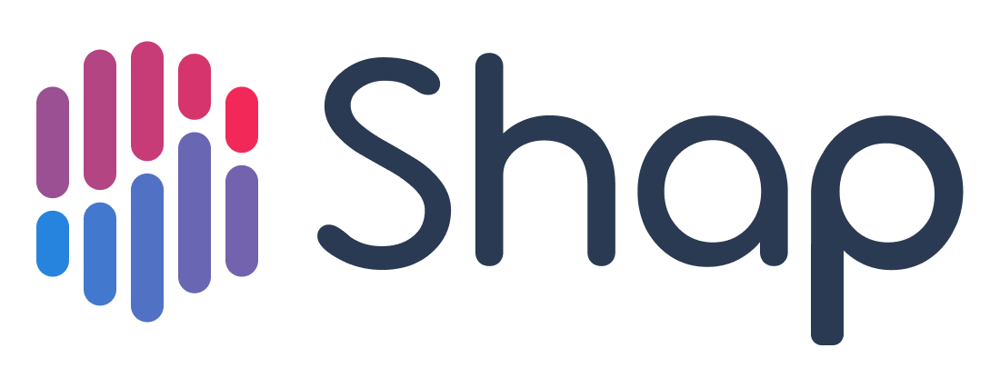

#### Source : https://github.com/slundberg/shap/issues/831

---

# Interprétation avec les valeurs de Shap :

---

In [44]:
pip install shap

     -------------------------------------- 435.6/435.6 kB 5.5 MB/s eta 0:00:00
  Using cached slicer-0.0.7-py3-none-any.whl (14 kB)
Note: you may need to restart the kernel to use updated packages.


In [1]:
import shap

In [ ]:
'boosting_type': 'Plain',
 'bootstrap_type': 'Bernoulli',
 'colsample_bylevel': 0.09311703845931836,
 'depth': 7,
 'l2_leaf_reg': 4.64851685043729,
 'learning_rate': 0.09969784585552582,
 'loss_function': 'RMSE',
 'min_data_in_leaf': 150,
 'one_hot_max_size': 7,
 'random_strength': 17.67,
 'subsample': 0.5908865969853988

In [48]:
features = X.columns

In [46]:
# Récupérer le meilleur modèle entraîné :
best_model = grid_search.best_estimator_

# Créer l'objet pour le calcul des valeurs de Shap :
explainer = shap.TreeExplainer(best_model)
#explainer = shap.TreeExplainer(regressor)

# Calculer les valeurs de Shap :
shap_values = explainer.shap_values(X_train)

---

## SHAP Feature importance

---

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


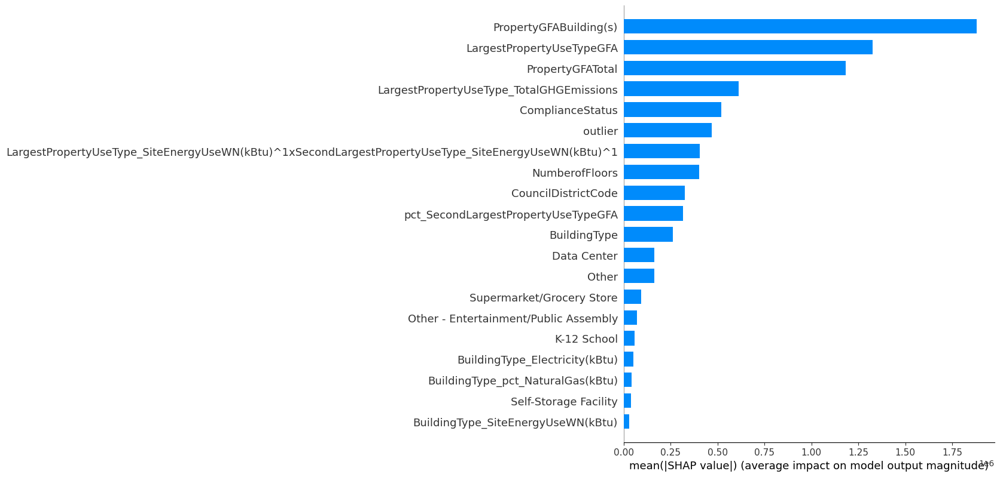

In [49]:
shap.summary_plot(shap_values, X_train, feature_names=features, plot_type="bar")

---

## SHAP Summary Plot

---

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


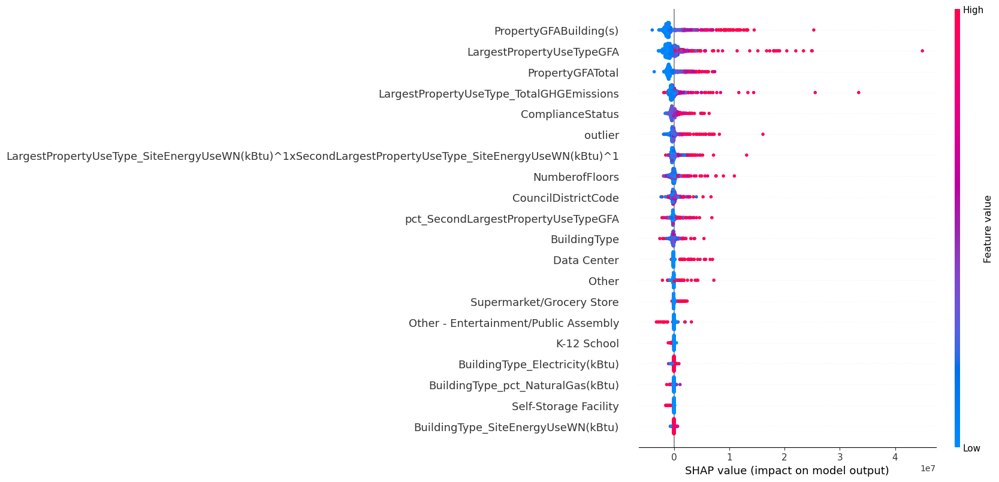

In [50]:
shap.summary_plot(shap_values, X_train, feature_names=features)

## SHAP Dependence Plot

---

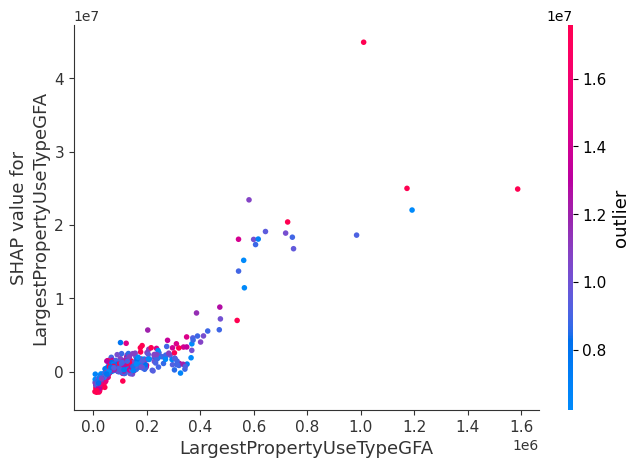

In [51]:
shap.dependence_plot(5, shap_values, X_train, feature_names=features)

---

#### 📌 Initialisation de js (javascript) :

In [77]:
shap.initjs()

---

## SHAP Force plot

---

In [101]:
i = 1
#shap.force_plot(explainer.expected_value, shap_values[i], X_test[i], feature_names = features)
shap.force_plot(explainer.expected_value, shap_values[i], X_test[:i], feature_names = features)

In [79]:
# visualize the first 5 predictions explanations with a dark red dark blue color map.
shap.force_plot(explainer.expected_value, shap_values[0:5], X_test[0:5], plot_cmap="DrDb", feature_names=features)

---

## SHAP Decision plot

---

In [106]:
shap.decision_plot(explainer.expected_value[1], shap_values[:1], feature_names = list(features))

IndexError: invalid index to scalar variable.

---

### Autre modèle qui pourra être tester à l'avenir :

In [ ]:
### Source : https://www.kaggle.com/code/hamzaghanmi/xgboost-catboost-using-optuna